# Reading in and processing the satellite data

In [10]:
# First we need to map between the satellite and the files

import pandas as pd
import os

data_dir = '../data/harvard/'
df = pd.read_csv(f'{data_dir}tallo_neon_species_dedup_subsample_annotation.csv', encoding='latin-1')
species = ['Pseudotsuga menziesii', 'Pinus palustris', 'Acer rubrum',
       'Quercus stellata', 'Acer saccharum', 'Quercus rubra',
       'Populus tremuloides', 'Tsuga canadensis', 'Tsuga heterophylla',
       'Fagus grandifolia', 'Cornus drummondii', 'Metrosideros polymorpha',
       'Abies balsamea', 'Picea engelmannii', 'Pinus contorta',
       'Liquidambar styraciflua', 'Calocedrus decurrens', 'Quercus alba',
       'Pinus sp.', 'Abies lasiocarpa']
df = df[df.species.isin(species)]

sat_files = os.listdir(f'{data_dir}neon_harvard/')

img_id_to_paths = {}
for f in sat_files:
    try:
        for s in os.listdir(f'{data_dir}neon_harvard/{f}/PSScene/'):
            if '.tif' in s and '_3B_AnalyticMS_SR_8b_clip.tif' in s: #'20221218_230845_90_2459_3B_AnalyticMS_SR_8b_clip.tif'
                img_id = s.replace('_3B_AnalyticMS_SR_8b_clip.tif', '')
                img_id_to_paths[img_id] = f'{data_dir}neon_harvard/{f}/PSScene/{s}'
    except:
        print(f)

# Now add to the df
paths = []
for img_id in df['image_ids'].values:
    paths.append(img_id_to_paths.get(img_id))
df['path'] = paths
df

.DS_Store


,Unnamed: 0,latitude,longitude,tree_id,forest_type,data_1,data_2,data_3,data_4,data_5,...,stem_diameter_cm,height_m,crown_radius_m,binary_label,x0,x1,y0,y1,image_ids,path
0,18,43.180,-124.090,T_448313,mixed,"43.180045, -124.090194","43.179634, -124.090398","43.179786, -124.089398","43.179472, -124.090165","43.179851, -124.089327",...,58.566667,30.933333,5.404167,1,43.176875,43.183125,-124.092252,-124.087748,20230224_180814_95_241e,../data/harvard/neon_harvard/4c94e293-8431-45a...
1,19,44.640,-123.910,T_451467,mixed,"44.639992, -123.910599","44.640148, -123.909890","44.640102, -123.908707","44.639627, -123.908839","44.639753, -123.908393",...,62.650000,37.950000,4.725000,1,44.636875,44.643125,-123.912252,-123.907748,20230224_180752_75_241e,../data/harvard/neon_harvard/07f1b2ed-6767-4e9...
2,20,45.160,-121.170,T_450528,NaN,"45.160205, -121.170810","45.160045, -121.170967","45.160745, -121.169983","45.159887, -121.171418","45.159564, -121.171777",...,42.100000,26.500000,3.550000,1,45.156875,45.163125,-121.172252,-121.167748,20230212_180410_24_24ab,../data/harvard/neon_harvard/7a6ef780-7fe5-42d...
3,21,46.020,-123.710,T_447213,NaN,"46.020262, -123.710049","46.021033, -123.709783","46.021152, -123.709844","46.021501, -123.710043","46.019567, -123.710409",...,44.180000,24.500000,3.250000,1,46.016875,46.023125,-123.712252,-123.707748,20221215_180843_61_2465,../data/harvard/neon_harvard/c697f442-d50d-408...
4,22,46.560,-123.780,T_448773,NaN,"46.559960, -123.779908","46.559681, -123.780057","46.559581, -123.780123","46.559583, -123.779731","46.559983, -123.779724",...,41.055556,28.433333,3.483333,1,46.556875,46.563125,-123.782252,-123.777748,20230215_180750_09_2451,../data/harvard/neon_harvard/634bd458-fec8-447...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,481,42.950,-123.350,T_87413,too mixed - can't tell not pine,NaN,NaN,NaN,NaN,NaN,...,62.575000,43.666667,NaN,1,42.946875,42.953125,-123.352252,-123.347748,20230118_180049_53_2451,../data/harvard/neon_harvard/c16d425a-246b-413...
134,482,40.710,-123.930,T_447053,too mixed - can't tell not pine,NaN,NaN,NaN,NaN,NaN,...,38.112500,19.012500,3.506250,1,40.706875,40.713125,-123.932252,-123.927748,20230206_181042_27_24bb,../data/harvard/neon_harvard/9e387f02-5516-4b5...
135,483,38.530,-122.950,T_451350,NaN,"38.530320, -122.949642","38.529752, -122.950929","38.530627, -122.950700","38.529767, -122.949598","38.529382, -122.949979",...,70.433333,37.833333,6.150000,1,38.526875,38.533125,-122.952252,-122.947748,20230128_175510_50_2451,../data/harvard/neon_harvard/d2c762cd-a87a-4bc...
136,484,45.590,-118.730,T_448779,cutdown,NaN,NaN,NaN,NaN,NaN,...,43.862500,23.575000,3.400000,1,45.586875,45.593125,-118.732252,-118.727748,20230216_174806_17_241e,../data/harvard/neon_harvard/026f24ed-f7ff-421...


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
plt.rcParams['svg.fonttype'] = 'none'
from remseno import *
fig_dir = f'{data_dir}fig/'
n = 3
fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

axs = axs.ravel()
axi = 0
for species in set(df['species'].values):
    sub_df = df[df['species'] == species]
    ni = 0
    for img_path in sub_df['path'].values:
        if ni >= n:
            break
        if img_path != None:
            o = Image()
            o.load_image(image_path=img_path)
            o.name = species
            ax = o.plot_rbg(axs[axi])
            ax.set_yticks([])
            ax.set_xticks([])
            axi += 1
            ni += 1
plt.axis('off')
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)

plt.savefig(f'{fig_dir}planetscope_data_overview.svg')
plt.show()


--------------------------------------------------------------------------------
left edge coord:	522339.0	
bottom edge coord:	3947124.0	
right edge coord:	522909.0	
top edge coord:	3947628.0	
dataset width:	190	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32638	
data transform
	| 3.00, 0.00, 522339.00|
| 0.00,-3.00, 3947628.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	257790.0	
bottom edge coord:	4292787.0	
right edge coord:	258354.0	
top edge coord:	4293309.0	
dataset width:	188	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 257790.00|
| 0.00,-3.00, 4293309.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	309798.0	
bottom edge coord:	4641729.0	
right edge coord:	310335.0	
top edge coord:	4642245.0	
dataset width:	179	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 309798.00|
| 0.00,-3.00, 4642245.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	734901.0	
bottom edge coord:	5882502.0	
right edge coord:	735474.0	
top edge coord:	5883021.0	
dataset width:	191	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32754	
data transform
	| 3.00, 0.00, 734901.00|
| 0.00,-3.00, 5883021.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	341751.0	
bottom edge coord:	4718715.0	
right edge coord:	342279.0	
top edge coord:	4719231.0	
dataset width:	176	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 341751.00|
| 0.00,-3.00, 4719231.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	278787.0	
bottom edge coord:	4726767.0	
right edge coord:	279318.0	
top edge coord:	4727289.0	
dataset width:	177	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 278787.00|
| 0.00,-3.00, 4727289.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------


# Plot NDVI filter/mask for each of these

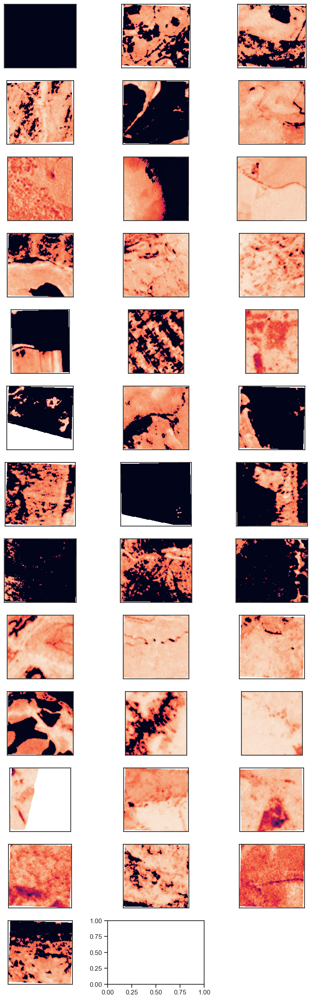

In [29]:
import matplotlib.pyplot as plt
from remseno import *
fig_dir = f'{data_dir}fig/'
n = 3

fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

axs = axs.ravel()
axi = 0
for species in set(df['species'].values):
    sub_df = df[df['species'] == species]
    ni = 0
    for img_path in sub_df['path'].values:
        if ni >= n:
            break
        if img_path != None:
            o = Image()
            o.load_image(image_path=img_path)
            o.name = species
            ndvi = get_ndvi(image=o.image, red_band=6, nir_band=8)
            mask = o.mask_on_index(ndvi, 0.5)
            axs[axi].imshow(mask*ndvi)
            axs[axi].set_yticks([])
            axs[axi].set_xticks([])
            axi += 1
            ni += 1
plt.axis('off')
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)
plt.savefig(f'{fig_dir}Figure2_planetscope_NDVI_mask.svg')
plt.show()


# have a look at the manually annotated trees

In [11]:
df = df.dropna(subset=['data_5'])
df['path'] = [img_id_to_paths.get(image_id) for image_id in df['image_ids'].values]

/var/folders/gq/6ljhmvm1713fykdjqbl188pm0000gn/T/ipykernel_65383/2918586551.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['path'] = [img_id_to_paths.get(image_id) for image_id in df['image_ids'].values]


In [23]:
def get_features_for_tree(lat, lon, img, bands=[1, 2, 3, 4, 5, 6, 7, 8]):
    image_bands = []
    for band in bands: 
        image_bands.append(img.image.read(band)) 

    nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar = get_all_planetscope(img.image)
    info_cols = image_bands + [nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar]
    return get_values_for_location(o, lat, lon, info_cols)
    
def get_features_for_xy(y, x, img, bands=[1, 2, 3, 4, 5, 6, 7, 8]):
    image_bands = []
    for band in bands: 
        image_bands.append(img.image.read(band)) 

    nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar = get_all_planetscope(img.image)
    info_cols = image_bands + [nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar]
    return get_values_for_xy(y, x, info_cols)
    
def get_values_for_xy(x, y, bands_indices):
    # Gets all values, i.e. all bands, and all indicies
    # Now get all bands
    row = []
    for b in bands_indices:
        row.append(b[x, y])
    return row

In [18]:
bands = [1, 2, 3, 4, 5, 6, 7, 8]
masking_cols = [f'band_{i}' for i in bands] + ['nitian', 'ndvi', 'sr', 'tvi', 'gi', 'gndvi', 'pri', 'osavi', 'tcari', 'redge', 'redge2',
            'siredge', 'normg', 'schl', 'schlcar']

In [36]:
# Need to expand out the data rows 


,Unnamed: 0,latitude,longitude,tree_id,forest_type,data_1,data_2,data_3,data_4,data_5,...,stem_diameter_cm,height_m,crown_radius_m,binary_label,x0,x1,y0,y1,image_ids,path
0,18,43.180,-124.090,T_448313,mixed,"43.180045, -124.090194","43.179634, -124.090398","43.179786, -124.089398","43.179472, -124.090165","43.179851, -124.089327",...,58.566667,30.933333,5.404167,1,43.176875,43.183125,-124.092252,-124.087748,20230224_180814_95_241e,../data/harvard/neon_harvard/4c94e293-8431-45a...
1,19,44.640,-123.910,T_451467,mixed,"44.639992, -123.910599","44.640148, -123.909890","44.640102, -123.908707","44.639627, -123.908839","44.639753, -123.908393",...,62.650000,37.950000,4.725000,1,44.636875,44.643125,-123.912252,-123.907748,20230224_180752_75_241e,../data/harvard/neon_harvard/07f1b2ed-6767-4e9...
2,20,45.160,-121.170,T_450528,NaN,"45.160205, -121.170810","45.160045, -121.170967","45.160745, -121.169983","45.159887, -121.171418","45.159564, -121.171777",...,42.100000,26.500000,3.550000,1,45.156875,45.163125,-121.172252,-121.167748,20230212_180410_24_24ab,../data/harvard/neon_harvard/7a6ef780-7fe5-42d...
3,21,46.020,-123.710,T_447213,NaN,"46.020262, -123.710049","46.021033, -123.709783","46.021152, -123.709844","46.021501, -123.710043","46.019567, -123.710409",...,44.180000,24.500000,3.250000,1,46.016875,46.023125,-123.712252,-123.707748,20221215_180843_61_2465,../data/harvard/neon_harvard/c697f442-d50d-408...
4,22,46.560,-123.780,T_448773,NaN,"46.559960, -123.779908","46.559681, -123.780057","46.559581, -123.780123","46.559583, -123.779731","46.559983, -123.779724",...,41.055556,28.433333,3.483333,1,46.556875,46.563125,-123.782252,-123.777748,20230215_180750_09_2451,../data/harvard/neon_harvard/634bd458-fec8-447...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,477,44.900,-122.580,T_447840,NaN,"44.898857, -122.579649","44.898584, -122.579613","44.898747, -122.579116","44.898426, -122.579202","44.898677, -122.579843",...,29.800000,17.025000,3.137500,1,44.896875,44.903125,-122.582252,-122.577748,20230224_180134_26_2459,../data/harvard/neon_harvard/228b5972-6de0-416...
130,478,43.002,-2.877,T_278486,NaN,"43.001846, -2.876984","43.001918, -2.877299","43.001703, -2.877158","43.001839, -2.876599","43.001618, -2.876861",...,32.500000,26.000000,3.250000,1,42.998875,43.005125,-2.879252,-2.874748,20230220_104003_95_249a,../data/harvard/neon_harvard/573790e9-c28b-4b0...
131,479,44.490,-122.540,T_451365,NaN,"44.490278, -122.540268","44.490329, -122.540517","44.490382, -122.539987","44.490364, -122.539542","44.489807, -122.539706",...,70.922222,39.111111,5.000000,1,44.486875,44.493125,-122.542252,-122.537748,20230224_180328_04_2429,../data/harvard/neon_harvard/02fab5e6-eb73-4fe...
132,480,44.650,-123.230,T_81306,NaN,"44.652036, -123.235204","44.652249, -123.235158","44.651822, -123.235858","44.652004, -123.235721","44.652097, -123.235031",...,3.400000,1.920000,NaN,1,44.646875,44.653125,-123.232252,-123.227748,20230113_180755_27_245c,../data/harvard/neon_harvard/1ee47288-7eab-43d...


In [68]:
df.to_csv(f'{data_dir}tallo_neon_species_dedup_subsample_annotation.csv')

In [69]:
c = Coords(f'{data_dir}tallo_neon_species_dedup_subsample_annotation.csv', x_col='latitude',
           y_col='longitude', label_col='tree_id', id_col='species', sep=',', class1=s, class2=s, crs="EPSG:4326")

--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Tsuga heterophylla	Tsuga heterophylla	 in column:	tree_id	Your dataset origionally had:	112	
Now you have:	112	
--------------------------------------------------------------------------------


In [73]:
n = 3
training_rows = []
err = 0
# Cool! So now we want to collect the values that pass all the masking...
for image_id in set(df['image_ids'].values):
    #try:
    sub_df = df[df['image_ids'] == image_id]
    species = sub_df['species'].values[0]
    t_ids = sub_df['tree_id'].values
    img_path = sub_df['path'].values[0]
    if img_path != None:
        o = Image()
        o.load_image(image_path=img_path)
        o.name = species
        # Do this for each image, and also plot any coordinates on them as well 
        # Image bands is something like below, we leave it up to the user to define i.e. could be indicies
        image_bands = []
        for band in bands: # Always normalise so that it is easier for
            normed = o.image.read(band)
            image_bands.append(normed)
        img = o.image

        nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar = get_all_planetscope(img)
        info_cols = image_bands + [nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar]
        for t_id in t_ids:
            data_rows = sub_df[['data_1', 'data_2', 'data_3', 'data_4', 'data_5']].values
            t_ids = sub_df['tree_id'].values
            image_ids = sub_df['image_ids'].values
            paths = sub_df['path'].values
           
            for d in data_rows[0]:
                try:
                    lat_lon = d.strip().split(',')
                    lon, lat = c.transform_coord(float(lat_lon[0]), float(lat_lon[1]), src="EPSG:4326", dest=str(o.image.crs))
                    # Get the values for this point
                    row = [t_id, lon, lat, species, image_id, img_path]
                    row += get_features_for_tree(lon, lat, o)
                    training_rows.append(row)
                except:
                    err += 1

--------------------------------------------------------------------------------
left edge coord:	753237.0	
bottom edge coord:	3640983.0	
right edge coord:	753840.0	
top edge coord:	3641499.0	
dataset width:	201	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 753237.00|
| 0.00,-3.00, 3641499.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	379908.0	
bottom edge coord:	4054410.0	
right edge coord:	380478.0	
top edge coord:	4054920.0	
dataset width:	190	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 379908.00|
| 0.00,-3.00, 4054920.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	264576.0	
bottom edge coord:	4184505.0	
right edge coord:	265146.0	
top edge coord:	4185024.0	
dataset width:	190	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32613	
data transform
	| 3.00, 0.00, 264576.00|
| 0.00,-3.00, 4185024.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	262503.0	
bottom edge coord:	4014651.0	
right edge coord:	263079.0	
top edge coord:	4015170.0	
dataset width:	192	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32618	
data transform
	| 3.00, 0.00, 262503.00|
| 0.00,-3.00, 4015170.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	295575.0	
bottom edge coord:	3630963.0	
right edge coord:	296175.0	
top edge coord:	3631476.0	
dataset width:	200	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 295575.00|
| 0.00,-3.00, 3631476.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	436824.0	
bottom edge coord:	5220801.0	
right edge coord:	437304.0	
top edge coord:	5221311.0	
dataset width:	160	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32610	
data transform
	| 3.00, 0.00, 436824.00|
| 0.00,-3.00, 5221311.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	624660.0	
bottom edge coord:	4246470.0	
right edge coord:	625215.0	
top edge coord:	4246983.0	
dataset width:	185	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 624660.00|
| 0.00,-3.00, 4246983.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	404382.0	
bottom edge coord:	4983408.0	
right edge coord:	404886.0	
top edge coord:	4983918.0	
dataset width:	168	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 404382.00|
| 0.00,-3.00, 4983918.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	372675.0	
bottom edge coord:	5338575.0	
right edge coord:	373152.0	
top edge coord:	5339088.0	
dataset width:	159	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32621	
data transform
	| 3.00, 0.00, 372675.00|
| 0.00,-3.00, 5339088.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	304008.0	
bottom edge coord:	4247877.0	
right edge coord:	304569.0	
top edge coord:	4248393.0	
dataset width:	187	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32612	
data transform
	| 3.00, 0.00, 304008.00|
| 0.00,-3.00, 4248393.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	463080.0	
bottom edge coord:	4256685.0	
right edge coord:	463632.0	
top edge coord:	4257192.0	
dataset width:	184	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32613	
data transform
	| 3.00, 0.00, 463080.00|
| 0.00,-3.00, 4257192.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	377700.0	
bottom edge coord:	3606327.0	
right edge coord:	378294.0	
top edge coord:	3606837.0	
dataset width:	198	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 377700.00|
| 0.00,-3.00, 3606837.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	527775.0	
bottom edge coord:	5229426.0	
right edge coord:	528252.0	
top edge coord:	5229933.0	
dataset width:	159	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32611	
data transform
	| 3.00, 0.00, 527775.00|
| 0.00,-3.00, 5229933.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	520356.0	
bottom edge coord:	5184945.0	
right edge coord:	520836.0	
top edge coord:	5185449.0	
dataset width:	160	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32611	
data transform
	| 3.00, 0.00, 520356.00|
| 0.00,-3.00, 5185449.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	456492.0	
bottom edge coord:	4327740.0	
right edge coord:	457038.0	
top edge coord:	4328247.0	
dataset width:	182	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32618	
data transform
	| 3.00, 0.00, 456492.00|
| 0.00,-3.00, 4328247.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	632325.0	
bottom edge coord:	4310976.0	
right edge coord:	632877.0	
top edge coord:	4311486.0	
dataset width:	184	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 632325.00|
| 0.00,-3.00, 4311486.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	427578.0	
bottom edge coord:	4943109.0	
right edge coord:	428082.0	
top edge coord:	4943616.0	
dataset width:	168	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32610	
data transform
	| 3.00, 0.00, 427578.00|
| 0.00,-3.00, 4943616.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	453402.0	
bottom edge coord:	4445184.0	
right edge coord:	453942.0	
top edge coord:	4445688.0	
dataset width:	180	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32613	
data transform
	| 3.00, 0.00, 453402.00|
| 0.00,-3.00, 4445688.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	368973.0	
bottom edge coord:	3981336.0	
right edge coord:	369549.0	
top edge coord:	3981849.0	
dataset width:	192	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 368973.00|
| 0.00,-3.00, 3981849.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	411156.0	
bottom edge coord:	4781127.0	
right edge coord:	411675.0	
top edge coord:	4781634.0	
dataset width:	173	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32610	
data transform
	| 3.00, 0.00, 411156.00|
| 0.00,-3.00, 4781634.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	360525.0	
bottom edge coord:	4960872.0	
right edge coord:	361032.0	
top edge coord:	4961385.0	
dataset width:	169	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 360525.00|
| 0.00,-3.00, 4961385.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	373587.0	
bottom edge coord:	4588446.0	
right edge coord:	374121.0	
top edge coord:	4588959.0	
dataset width:	178	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32618	
data transform
	| 3.00, 0.00, 373587.00|
| 0.00,-3.00, 4588959.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	590685.0	
bottom edge coord:	4529073.0	
right edge coord:	591222.0	
top edge coord:	4529583.0	
dataset width:	179	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 590685.00|
| 0.00,-3.00, 4529583.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	228798.0	
bottom edge coord:	4114500.0	
right edge coord:	229374.0	
top edge coord:	4115019.0	
dataset width:	192	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32618	
data transform
	| 3.00, 0.00, 228798.00|
| 0.00,-3.00, 4115019.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	284055.0	
bottom edge coord:	4286148.0	
right edge coord:	284613.0	
top edge coord:	4286664.0	
dataset width:	186	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32618	
data transform
	| 3.00, 0.00, 284055.00|
| 0.00,-3.00, 4286664.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	232071.0	
bottom edge coord:	3868941.0	
right edge coord:	232659.0	
top edge coord:	3869460.0	
dataset width:	196	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32618	
data transform
	| 3.00, 0.00, 232071.00|
| 0.00,-3.00, 3869460.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	661215.0	
bottom edge coord:	4501401.0	
right edge coord:	661755.0	
top edge coord:	4501917.0	
dataset width:	180	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 661215.00|
| 0.00,-3.00, 4501917.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	512700.0	
bottom edge coord:	5197146.0	
right edge coord:	513180.0	
top edge coord:	5197653.0	
dataset width:	160	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32610	
data transform
	| 3.00, 0.00, 512700.00|
| 0.00,-3.00, 5197653.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	722433.0	
bottom edge coord:	4187490.0	
right edge coord:	723000.0	
top edge coord:	4188009.0	
dataset width:	189	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 722433.00|
| 0.00,-3.00, 4188009.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	509769.0	
bottom edge coord:	4760793.0	
right edge coord:	510282.0	
top edge coord:	4761297.0	
dataset width:	171	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32630	
data transform
	| 3.00, 0.00, 509769.00|
| 0.00,-3.00, 4761297.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	454083.0	
bottom edge coord:	4445067.0	
right edge coord:	454620.0	
top edge coord:	4445574.0	
dataset width:	179	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32613	
data transform
	| 3.00, 0.00, 454083.00|
| 0.00,-3.00, 4445574.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	702675.0	
bottom edge coord:	4166994.0	
right edge coord:	703242.0	
top edge coord:	4167510.0	
dataset width:	189	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 702675.00|
| 0.00,-3.00, 4167510.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	507564.0	
bottom edge coord:	5039361.0	
right edge coord:	508056.0	
top edge coord:	5039865.0	
dataset width:	164	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 507564.00|
| 0.00,-3.00, 5039865.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	328539.0	
bottom edge coord:	4761585.0	
right edge coord:	329064.0	
top edge coord:	4762101.0	
dataset width:	175	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32619	
data transform
	| 3.00, 0.00, 328539.00|
| 0.00,-3.00, 4762101.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	442281.0	
bottom edge coord:	4393311.0	
right edge coord:	442821.0	
top edge coord:	4393818.0	
dataset width:	180	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32613	
data transform
	| 3.00, 0.00, 442281.00|
| 0.00,-3.00, 4393818.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	425973.0	
bottom edge coord:	4107144.0	
right edge coord:	426537.0	
top edge coord:	4107651.0	
dataset width:	188	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 425973.00|
| 0.00,-3.00, 4107651.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	725409.0	
bottom edge coord:	4109835.0	
right edge coord:	725979.0	
top edge coord:	4110354.0	
dataset width:	190	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 725409.00|
| 0.00,-3.00, 4110354.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	317610.0	
bottom edge coord:	4878012.0	
right edge coord:	318129.0	
top edge coord:	4878531.0	
dataset width:	173	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32619	
data transform
	| 3.00, 0.00, 317610.00|
| 0.00,-3.00, 4878531.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	710646.0	
bottom edge coord:	5134104.0	
right edge coord:	711147.0	
top edge coord:	5134623.0	
dataset width:	167	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 710646.00|
| 0.00,-3.00, 5134623.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	643359.0	
bottom edge coord:	5079900.0	
right edge coord:	643860.0	
top edge coord:	5080413.0	
dataset width:	167	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 643359.00|
| 0.00,-3.00, 5080413.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	226938.0	
bottom edge coord:	3657033.0	
right edge coord:	227538.0	
top edge coord:	3657552.0	
dataset width:	200	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 226938.00|
| 0.00,-3.00, 3657552.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	565020.0	
bottom edge coord:	5651094.0	
right edge coord:	565467.0	
top edge coord:	5651604.0	
dataset width:	149	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32621	
data transform
	| 3.00, 0.00, 565020.00|
| 0.00,-3.00, 5651604.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	643578.0	
bottom edge coord:	5002095.0	
right edge coord:	644082.0	
top edge coord:	5002611.0	
dataset width:	168	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32610	
data transform
	| 3.00, 0.00, 643578.00|
| 0.00,-3.00, 5002611.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	538974.0	
bottom edge coord:	3392850.0	
right edge coord:	539577.0	
top edge coord:	3393354.0	
dataset width:	201	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 538974.00|
| 0.00,-3.00, 3393354.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	630798.0	
bottom edge coord:	4684053.0	
right edge coord:	631326.0	
top edge coord:	4684566.0	
dataset width:	176	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 630798.00|
| 0.00,-3.00, 4684566.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	726615.0	
bottom edge coord:	4730961.0	
right edge coord:	727146.0	
top edge coord:	4731483.0	
dataset width:	177	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 726615.00|
| 0.00,-3.00, 4731483.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	714681.0	
bottom edge coord:	4789722.0	
right edge coord:	715206.0	
top edge coord:	4790241.0	
dataset width:	175	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32629	
data transform
	| 3.00, 0.00, 714681.00|
| 0.00,-3.00, 4790241.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	548181.0	
bottom edge coord:	4459848.0	
right edge coord:	548718.0	
top edge coord:	4460355.0	
dataset width:	179	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32612	
data transform
	| 3.00, 0.00, 548181.00|
| 0.00,-3.00, 4460355.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	597375.0	
bottom edge coord:	4884558.0	
right edge coord:	597888.0	
top edge coord:	4885068.0	
dataset width:	171	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32618	
data transform
	| 3.00, 0.00, 597375.00|
| 0.00,-3.00, 4885068.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	454398.0	
bottom edge coord:	4412100.0	
right edge coord:	454938.0	
top edge coord:	4412607.0	
dataset width:	180	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32613	
data transform
	| 3.00, 0.00, 454398.00|
| 0.00,-3.00, 4412607.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	309441.0	
bottom edge coord:	4063449.0	
right edge coord:	310014.0	
top edge coord:	4063965.0	
dataset width:	191	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 309441.00|
| 0.00,-3.00, 4063965.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	425553.0	
bottom edge coord:	5402124.0	
right edge coord:	426021.0	
top edge coord:	5402634.0	
dataset width:	156	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32621	
data transform
	| 3.00, 0.00, 425553.00|
| 0.00,-3.00, 5402634.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	527190.0	
bottom edge coord:	3838455.0	
right edge coord:	527766.0	
top edge coord:	3838959.0	
dataset width:	192	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 527190.00|
| 0.00,-3.00, 3838959.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	427845.0	
bottom edge coord:	3391908.0	
right edge coord:	428448.0	
top edge coord:	3392415.0	
dataset width:	201	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 427845.00|
| 0.00,-3.00, 3392415.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

--------------------------------------------------------------------------------
left edge coord:	504084.0	
bottom edge coord:	4264371.0	
right edge coord:	504633.0	
top edge coord:	4264875.0	
dataset width:	183	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32610	
data transform
	| 3.00, 0.00, 504084.00|
| 0.00,-3.00, 4264875.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	337338.0	
bottom edge coord:	5013660.0	
right edge coord:	337845.0	
top edge coord:	5014176.0	
dataset width:	169	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 337338.00|
| 0.00,-3.00, 5014176.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

In [74]:
#t_ids[j], float(lat_lon[0]), float(lat_lon[1]), s, image_ids[j], paths[j]
bands = [1, 2, 3, 4, 5, 6, 7, 8]
masking_cols = [f'band_{i}' for i in bands] + ['nitian', 'ndvi', 'sr', 'tvi', 'gi', 'gndvi', 'pri', 'osavi', 'tcari', 'redge', 'redge2',
            'siredge', 'normg', 'schl', 'schlcar']
t_df = pd.DataFrame(training_rows, columns=['id', 'lat', 'lon', 'species', 'image_id', 'path'] + masking_cols)
t_df

,id,lat,lon,species,image_id,path,band_1,band_2,band_3,band_4,...,gndvi,pri,osavi,tcari,redge,redge2,siredge,normg,schl,schlcar
0,T_446408,753507.129317,3.641337e+06,Liquidambar styraciflua,20230107_151953_30_245c,../data/harvard/neon_harvard/6deabf58-9548-443...,481,538,618,735,...,0.603025,48.351072,0.508109,364670.4,5669.485714,1849.077551,0.689459,0.327979,0.397358,41.100883
1,T_446408,753557.150905,3.641365e+06,Liquidambar styraciflua,20230107_151953_30_245c,../data/harvard/neon_harvard/6deabf58-9548-443...,355,323,337,410,...,0.569554,87.634538,0.533290,197508.0,2760.280488,840.085366,0.601057,0.345118,0.378462,82.598485
2,T_446408,753586.253761,3.641464e+06,Liquidambar styraciflua,20230107_151953_30_245c,../data/harvard/neon_harvard/6deabf58-9548-443...,447,413,461,640,...,0.529065,59.361490,0.429137,128422.8,3610.525000,1442.125000,0.746403,0.339883,0.332187,50.477924
3,T_446408,753619.646059,3.641444e+06,Liquidambar styraciflua,20230107_151953_30_245c,../data/harvard/neon_harvard/6deabf58-9548-443...,408,458,491,622,...,0.519506,58.764600,0.429481,196170.0,3510.241158,1400.884244,0.707207,0.333512,0.311410,51.130094
4,T_446408,753625.733029,3.641415e+06,Liquidambar styraciflua,20230107_151953_30_245c,../data/harvard/neon_harvard/6deabf58-9548-443...,424,453,555,648,...,0.453165,54.399834,0.344241,122126.4,2933.777778,1431.111111,0.760870,0.333849,0.241218,46.774910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515,T_446302,618809.020578,5.078544e+06,Pinus contorta,20230216_173325_82_2463,../data/harvard/neon_harvard/e67ea863-9e53-40d...,2147,1899,1774,1932,...,0.271356,17.641123,0.328724,314099.4,3587.358178,1812.302277,0.828307,0.349115,0.259164,0.020420
516,T_446302,618827.183978,5.078508e+06,Pinus contorta,20230216_173325_82_2463,../data/harvard/neon_harvard/e67ea863-9e53-40d...,2821,2981,2695,2777,...,0.184913,11.961623,0.188572,117477.0,4339.375225,2962.427080,0.923283,0.326169,0.154865,12.011558
517,T_446302,618819.685153,5.078579e+06,Pinus contorta,20230216_173325_82_2463,../data/harvard/neon_harvard/e67ea863-9e53-40d...,2308,2160,1874,1929,...,0.264442,17.218249,0.325594,631218.0,3742.318300,1903.887506,0.774920,0.333968,0.227663,0.052513
518,T_446302,618810.117233,5.078442e+06,Pinus contorta,20230216_173325_82_2463,../data/harvard/neon_harvard/e67ea863-9e53-40d...,3025,2839,2751,3070,...,0.147222,11.203745,0.194673,468567.6,4345.244300,2929.094463,0.861920,0.353158,0.130171,11.834327


In [75]:
t_df = t_df.dropna()
t_df.to_csv(f'{data_dir}indicie_training_data.csv', index=False)

/var/folders/gq/6ljhmvm1713fykdjqbl188pm0000gn/T/ipykernel_65383/2932217434.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  t_df['PC1'] = pc_X[:, 0]
/var/folders/gq/6ljhmvm1713fykdjqbl188pm0000gn/T/ipykernel_65383/2932217434.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  t_df['PC2'] = pc_X[:, 1]


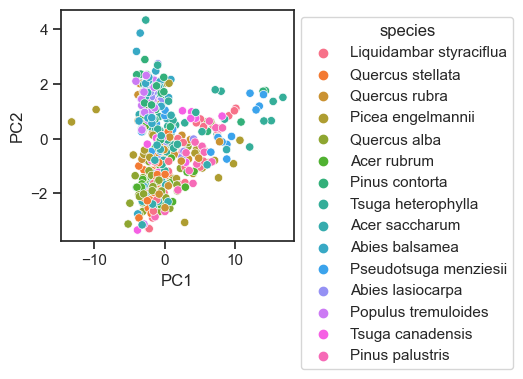

In [76]:
# We can make a PCA of the normalised values
from sklearn.decomposition import PCA
import seaborn as sns

X = t_df[masking_cols].values
X = np.nan_to_num(X)
pca = PCA(n_components=2)
min_x = X.min(axis=0)
max_x = X.max(axis=0)
mean_x = X.mean(axis=0)
std_x = X.std(axis=0)
X = (X - mean_x)/std_x
X_std = (X - min_x) / (max_x - min_x)

pca.fit(X_std)
pc_X = pca.transform(X_std)
t_df['PC1'] = pc_X[:, 0]
t_df['PC2'] = pc_X[:, 1]

ax = sns.scatterplot(data=t_df, x='PC1', y='PC2', hue='species')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


In [77]:
t_df = t_df.fillna(0)
t_df.to_csv(f'{data_dir}indices_for_training_trees.csv')

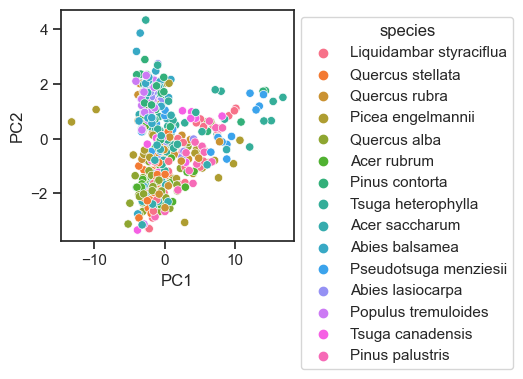

In [78]:
# We can make a PCA of the normalised values
from sklearn.decomposition import PCA
import seaborn as sns

X = t_df[masking_cols].values
X = np.nan_to_num(X)
pca = PCA(n_components=2)
min_x = X.min(axis=0)
max_x = X.max(axis=0)
mean_x = X.mean(axis=0)
std_x = X.std(axis=0)
X = (X - mean_x)/std_x
X_std = (X - min_x) / (max_x - min_x)

pca.fit(X_std)
pc_X = pca.transform(X_std)
t_df['PC1'] = pc_X[:, 0]
t_df['PC2'] = pc_X[:, 1]

ax = sns.scatterplot(data=t_df, x='PC1', y='PC2', hue='species')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


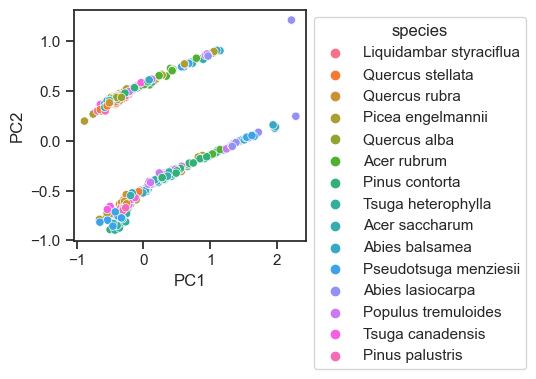

In [79]:
# We can make a PCA of the normalised values
from sklearn.decomposition import PCA
import seaborn as sns
X = t_df[masking_cols].values
pca = PCA(n_components=2)
min_x = np.nanmin(X, axis=0)
max_x = np.nanmax(X, axis=0)
mean_x = np.nanmean(X, axis=0)
std_x = np.nanstd(X, axis=0)
X = (X - mean_x)/std_x
min_x = np.nanmin(X, axis=0)
max_x = np.nanmax(X, axis=0)
X_std = (X - min_x) / (max_x - min_x)

pca.fit(X_std)
pc_X = pca.transform(X_std)
t_df['PC1'] = pc_X[:, 0]
t_df['PC2'] = pc_X[:, 1]

ax = sns.scatterplot(data=t_df, x='PC1', y='PC2', hue='species')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


# Now we have our filters, let's apply them to each of the images and see what they end up looking like...

1. We want to filter all images, and then select the pixels that passed the filtration process as our training data for the next point

In [80]:
masking_cols

['band_1',
 'band_2',
 'band_3',
 'band_4',
 'band_5',
 'band_6',
 'band_7',
 'band_8',
 'nitian',
 'ndvi',
 'sr',
 'tvi',
 'gi',
 'gndvi',
 'pri',
 'osavi',
 'tcari',
 'redge',
 'redge2',
 'siredge',
 'normg',
 'schl',
 'schlcar']

In [81]:
ind_df = t_df

In [82]:
def get_features_for_xy(y, x, img, bands=[1, 2, 3, 4, 5, 6, 7, 8]):
    image_bands = []
    for band in bands: 
        image_bands.append(img.image.read(band)) 

    nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar = get_all_planetscope(img.image)
    info_cols = image_bands + [nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar]
    return get_values_for_xy(y, x, info_cols)
    
def get_values_for_xy(x, y, bands_indices):
    # Gets all values, i.e. all bands, and all indicies
    # Now get all bands
    row = []
    for b in bands_indices:
        row.append(b[x, y])
    return row

In [95]:
n = 3
training_rows = []
err = 0
# Cool! So now we want to collect the values that pass all the masking...
for image_id in set(df['image_ids'].values):
    try:
        sub_df = df[df['image_ids'] == image_id]
        species = sub_df['species'].values[0]
        t_ids = sub_df['tree_id'].values
        ni = 0
        for ti, img_path in enumerate(sub_df['path'].values):
            t_id = t_ids[ti]
            if img_path != None:
                o = Image()
                o.load_image(image_path=img_path)
                o.name = species
                # Do this for each image, and also plot any coordinates on them as well 
                # Image bands is something like below, we leave it up to the user to define i.e. could be indicies
                image_bands = []
                bands = [1, 2, 3, 4, 5, 6, 7, 8]
                for band in bands: # Always normalise so that it is easier for
                    normed = o.image.read(band)
                    image_bands.append(normed)
                img = o.image

                nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar = get_all_planetscope(img)
                info_cols = image_bands + [nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar]
                masks = []
                for i, col in enumerate(masking_cols):
                    # Now we want to build a total mask...
                    mean_v = np.median(ind_df[col].values)
                    std_v = np.std(ind_df[col].values)
                    lower_bound = mean_v - std_v #np.min(ind_df[col].values) # - std_v #mean_v - std_v
                    upper_bound = mean_v + std_v #np.max(ind_df[col].values) # + std_v #mean_v + std_v
                    masks.append(mask_values(info_cols[i], lower_bound, upper_bound))

                total_mask = masks[0]
                for mi, mask in enumerate(masks[1:]):
                    total_mask *= mask
                    # Plot each tree individually and the class that it belongs to
#                     ax = o.plot(2, show_plot=False)
#                     ax.imshow(total_mask*ndvi, vmin=0, vmax=1)
#                     plt.title(f'Masked: {masking_cols[mi]} {species}')
#                     plt.show()
                # Save the values that are over a certain amount and also then save them as training data
                positions = np.where(total_mask > 0)                
                xs, ys = rasterio.transform.xy(o.image.transform, positions[0], positions[1])
                lons = np.array(xs)
                lats = np.array(ys)
                for i in range(0, len(lons)):
                    x, y = positions[0][i], positions[1][i]
                    # Get the values for this point
                    row = [t_id, lons[i], lats[i], species, image_id, img_path]
                    row += get_features_for_xy(y, x, o)
                    try:
                        training_rows.append(row)
                    except:
                        err += 1
                    # Write as a kml file
    #                 with open(f'{data_dir}levie_coord_v2.kml', 'w+') as fout:
    #                     fout.write('<kml xmlns="http://earth.google.com/kml/2.0"><Folder><name>OpenLayers export</name><description>Exported on Tue Jun 28 2016 16:31:00 GMT+0200 (CEST)</description>')
    #                     for i in range(0, len(lons), 50):
    #                         y, x = transformer.transform(lons[i], lats[i])
    #                         fout.write(f'<Placemark><name>Pred{i}</name><description>No description available</description><Point><coordinates>{x},{y}</coordinates></Point></Placemark>')

    #                     fout.write('</Folder></kml>')

    except:
        print(image_id)

--------------------------------------------------------------------------------
left edge coord:	753237.0	
bottom edge coord:	3640983.0	
right edge coord:	753840.0	
top edge coord:	3641499.0	
dataset width:	201	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 753237.00|
| 0.00,-3.00, 3641499.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
20230107_151953_30_245c
--------------------------------------------------------------------------------
left edge coord:	379908.0	
bottom edge coord:	4054410.0	
right edge coord:	380478.0	
top edge coord:	4054920.0	
dataset width:	190	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 379908.00|
| 0.00,-3.00, 4054920.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

20230203_160136_70_241b
--------------------------------------------------------------------------------
left edge coord:	298428.0	
bottom edge coord:	4089234.0	
right edge coord:	299001.0	
top edge coord:	4089750.0	
dataset width:	191	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32618	
data transform
	| 3.00, 0.00, 298428.00|
| 0.00,-3.00, 4089750.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
20230204_145628_22_2421
--------------------------------------------------------------------------------
left edge coord:	735216.0	
bottom edge coord:	4926969.0	
right edge coord:	735735.0	
top edge coord:	4927488.0	
dataset width:	173	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 735216.00|
| 0.00,-3.00, 4927488.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----

20230213_155127_30_241f
--------------------------------------------------------------------------------
left edge coord:	736749.0	
bottom edge coord:	4494534.0	
right edge coord:	737298.0	
top edge coord:	4495053.0	
dataset width:	183	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32612	
data transform
	| 3.00, 0.00, 736749.00|
| 0.00,-3.00, 4495053.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	463080.0	
bottom edge coord:	4256685.0	
right edge coord:	463632.0	
top edge coord:	4257192.0	
dataset width:	184	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32613	
data transform
	| 3.00, 0.00, 463080.00|
| 0.00,-3.00, 4257192.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
20230213_164606_69_242b
----

20230217_160005_04_24c0
--------------------------------------------------------------------------------
left edge coord:	368973.0	
bottom edge coord:	3981336.0	
right edge coord:	369549.0	
top edge coord:	3981849.0	
dataset width:	192	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 368973.00|
| 0.00,-3.00, 3981849.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
20230211_154433_74_24ce
--------------------------------------------------------------------------------
left edge coord:	411156.0	
bottom edge coord:	4781127.0	
right edge coord:	411675.0	
top edge coord:	4781634.0	
dataset width:	173	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32610	
data transform
	| 3.00, 0.00, 411156.00|
| 0.00,-3.00, 4781634.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
2023

20230224_180134_26_2459
--------------------------------------------------------------------------------
left edge coord:	661215.0	
bottom edge coord:	4501401.0	
right edge coord:	661755.0	
top edge coord:	4501917.0	
dataset width:	180	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 661215.00|
| 0.00,-3.00, 4501917.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
20230214_150933_46_24b6
--------------------------------------------------------------------------------
left edge coord:	512700.0	
bottom edge coord:	5197146.0	
right edge coord:	513180.0	
top edge coord:	5197653.0	
dataset width:	160	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32610	
data transform
	| 3.00, 0.00, 512700.00|
| 0.00,-3.00, 5197653.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
2023

--------------------------------------------------------------------------------
left edge coord:	442281.0	
bottom edge coord:	4393311.0	
right edge coord:	442821.0	
top edge coord:	4393818.0	
dataset width:	180	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32613	
data transform
	| 3.00, 0.00, 442281.00|
| 0.00,-3.00, 4393818.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
20230202_165619_71_24c4
--------------------------------------------------------------------------------
left edge coord:	425973.0	
bottom edge coord:	4107144.0	
right edge coord:	426537.0	
top edge coord:	4107651.0	
dataset width:	188	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32615	
data transform
	| 3.00, 0.00, 425973.00|
| 0.00,-3.00, 4107651.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
20230117_155821_38_241b
----

20230107_151139_78_2451
--------------------------------------------------------------------------------
left edge coord:	643578.0	
bottom edge coord:	5002095.0	
right edge coord:	644082.0	
top edge coord:	5002611.0	
dataset width:	168	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32610	
data transform
	| 3.00, 0.00, 643578.00|
| 0.00,-3.00, 5002611.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
20230212_180410_24_24ab
--------------------------------------------------------------------------------
left edge coord:	538974.0	
bottom edge coord:	3392850.0	
right edge coord:	539577.0	
top edge coord:	3393354.0	
dataset width:	201	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32616	
data transform
	| 3.00, 0.00, 538974.00|
| 0.00,-3.00, 3393354.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
2023

--------------------------------------------------------------------------------
left edge coord:	309441.0	
bottom edge coord:	4063449.0	
right edge coord:	310014.0	
top edge coord:	4063965.0	
dataset width:	191	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32617	
data transform
	| 3.00, 0.00, 309441.00|
| 0.00,-3.00, 4063965.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
20230204_155326_16_249a
--------------------------------------------------------------------------------
left edge coord:	425553.0	
bottom edge coord:	5402124.0	
right edge coord:	426021.0	
top edge coord:	5402634.0	
dataset width:	156	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32621	
data transform
	| 3.00, 0.00, 425553.00|
| 0.00,-3.00, 5402634.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------

In [96]:
len(training_rows)
#t_ids[j], float(lat_lon[0]), float(lat_lon[1]), s, image_ids[j], paths[j]
bands = [1, 2, 3, 4, 5, 6, 7, 8]
masking_cols = [f'band_{i}' for i in bands] + ['nitian', 'ndvi', 'sr', 'tvi', 'gi', 'gndvi', 'pri', 'osavi', 'tcari', 'redge', 'redge2',
            'siredge', 'normg', 'schl', 'schlcar']
training_df = pd.DataFrame(training_rows, columns=['id', 'lat', 'lon', 'species', 'image_id', 'path'] + masking_cols)


In [97]:
training_df.to_csv(f'{data_dir}training_pixels_tallo_neon.csv', index=False)

In [98]:
training_df.dropna().to_csv(f'{data_dir}training_pixels_tallo_neon_nn.csv', index=False)

In [100]:
training_df

,id,lat,lon,species,image_id,path,band_1,band_2,band_3,band_4,...,gndvi,pri,osavi,tcari,redge,redge2,siredge,normg,schl,schlcar
85,T_447409,380179.5,4054915.5,Quercus stellata,20230203_160136_70_241b,../data/harvard/neon_harvard/1caebd02-4233-4ff...,789,737,784,889,...,0.475671,39.109982,0.373954,255816.0,4260.998875,1941.462317,0.752972,0.321403,0.271280,33.877339
86,T_447409,380182.5,4054915.5,Quercus stellata,20230203_160136_70_241b,../data/harvard/neon_harvard/1caebd02-4233-4ff...,758,607,690,787,...,0.498886,44.305349,0.397428,270833.4,4169.601017,1797.852605,0.728121,0.326692,0.284951,38.246921
87,T_447409,380185.5,4054915.5,Quercus stellata,20230203_160136_70_241b,../data/harvard/neon_harvard/1caebd02-4233-4ff...,724,542,618,735,...,0.475000,48.351072,0.378025,172236.0,3489.428571,1574.889796,0.750403,0.332730,0.274608,42.078710
88,T_447409,380188.5,4054915.5,Quercus stellata,20230203_160136_70_241b,../data/harvard/neon_harvard/1caebd02-4233-4ff...,694,508,547,685,...,0.470429,53.082792,0.392364,139444.2,3079.296350,1343.751825,0.748422,0.338606,0.290264,47.387800
89,T_447409,380191.5,4054915.5,Quercus stellata,20230203_160136_70_241b,../data/harvard/neon_harvard/1caebd02-4233-4ff...,634,487,495,617,...,0.507778,58.825540,0.458305,177426.6,3066.272285,1138.901135,0.701299,0.341639,0.342978,54.577277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227753,T_446302,618970.5,5078281.5,Pinus contorta,20230216_173325_82_2463,../data/harvard/neon_harvard/e67ea863-9e53-40d...,4926,5211,5133,5443,...,0.127934,6.167360,0.158464,990336.0,7442.248760,5406.201727,0.888773,0.345193,0.105809,0.001854
227754,T_446302,618973.5,5078281.5,Pinus contorta,20230216_173325_82_2463,../data/harvard/neon_harvard/e67ea863-9e53-40d...,5145,5376,5459,5745,...,0.096627,5.823813,0.131590,1283353.2,7368.525674,5654.767624,0.881713,0.348753,0.073341,0.009897
227755,T_446302,619021.5,5078281.5,Pinus contorta,20230216_173325_82_2463,../data/harvard/neon_harvard/e67ea863-9e53-40d...,3018,2893,2937,3171,...,0.131233,10.691225,0.167700,405902.4,4368.588773,3113.770104,0.877198,0.352060,0.109446,11.144558
227756,T_446302,619030.5,5078281.5,Pinus contorta,20230216_173325_82_2463,../data/harvard/neon_harvard/e67ea863-9e53-40d...,2671,2699,2800,3037,...,0.191427,11.187082,0.261090,857779.2,4712.232466,2760.999671,0.819887,0.363364,0.179935,0.032829


In [99]:
training_df = training_df.dropna()
training_df['species'].value_counts()

species
Tsuga heterophylla         60574
Acer saccharum             26943
Abies balsamea             24590
Pseudotsuga menziesii      23346
Populus tremuloides        22763
Tsuga canadensis           18819
Pinus contorta             11264
Acer rubrum                 7406
Quercus rubra               6872
Quercus alba                4060
Liquidambar styraciflua     2791
Picea engelmannii           1420
Abies lasiocarpa             959
Pinus palustris              797
Quercus stellata             182
Metrosideros polymorpha        2
Name: count, dtype: int64

# Make ML model

In [88]:
# We can make a PCA of the normalised values
from sklearn.decomposition import PCA
import seaborn as sns

X = training_df[masking_cols].values
X = np.nan_to_num(X)
pca = PCA(n_components=2)
min_x = X.min(axis=0)
max_x = X.max(axis=0)
mean_x = X.mean(axis=0)
std_x = X.std(axis=0)
X = (X - mean_x)/std_x
X_std = (X - min_x) / (max_x - min_x)

pca.fit(X_std)
pc_X = pca.transform(X_std)
training_df['PC1'] = pc_X[:, 0]
training_df['PC2'] = pc_X[:, 1]

ax = sns.scatterplot(data=training_df, x='PC1', y='PC2', hue='species', alpha=0.5)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


Error in callback <function _draw_all_if_interactive at 0x11f17b370> (for post_execute):



KeyboardInterrupt



Error in callback <function flush_figures at 0x1483efa30> (for post_execute):



KeyboardInterrupt



In [89]:

ax = sns.scatterplot(data=training_df, x='PC1', y='PC2', hue='species', alpha=0.5)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


Error in callback <function _draw_all_if_interactive at 0x11f17b370> (for post_execute):



KeyboardInterrupt



Error in callback <function flush_figures at 0x1483efa30> (for post_execute):



KeyboardInterrupt



In [90]:
from remseno import *
training_df = pd.read_csv(f'{data_dir}training_pixels_nn.csv')

FileNotFoundError: [Errno 2] No such file or directory: '../data/harvard/training_pixels_nn.csv'

In [18]:
data_dir

'../data/tallo/planetscope/'

In [51]:
clf = svm.LinearSVC(multi_class="crammer_singer", class_weight='balanced')
test_percent = 25
bands = [1, 2, 3, 4, 5, 6, 7, 8]
masking_cols = [f'band_{i}' for i in bands] + ['nitian', 'ndvi', 'sr', 'tvi', 'gi', 'gndvi', 'pri', 'osavi', 'tcari', 'redge', 'redge2',
            'siredge', 'normg', 'schl', 'schlcar']

train_df = pd.DataFrame()# Get a random sample which is even between each species
for species in set(training_df['species'].values):
    s_df = training_df[training_df['species'] == species]
    train_df = pd.concat([train_df, s_df.sample(min(500, len(s_df)))])
    
X = train_df[masking_cols].values

X = np.nan_to_num(X)
min_x = X.min(axis=0)
max_x = X.max(axis=0)
mean_x = X.mean(axis=0)
std_x = X.std(axis=0)
X = (X - min_x) / (max_x - min_x)
y = train_df['species']
# Train model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_percent/100,
                                                    random_state=18)


In [53]:
data_dir

'../data/tallo/planetscope/'

In [52]:
train_df['species'].value_counts()

species
Pinus nigra                 500
Quercus robur               500
Quercus petraea             500
Eucalyptus camaldulensis    500
Pinus sylvestris            500
Pinus pinea                 500
Quercus ilex                500
Castanea sativa             500
Fagus sylvatica             500
Pinus halepensis            394
Quercus faginea             178
Eucalyptus globulus          33
Name: count, dtype: int64

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


0.7345340642129993 ['Castanea sativa' 'Fagus sylvatica' 'Pinus nigra' ... 'Quercus petraea'
 'Pinus halepensis' 'Quercus robur']


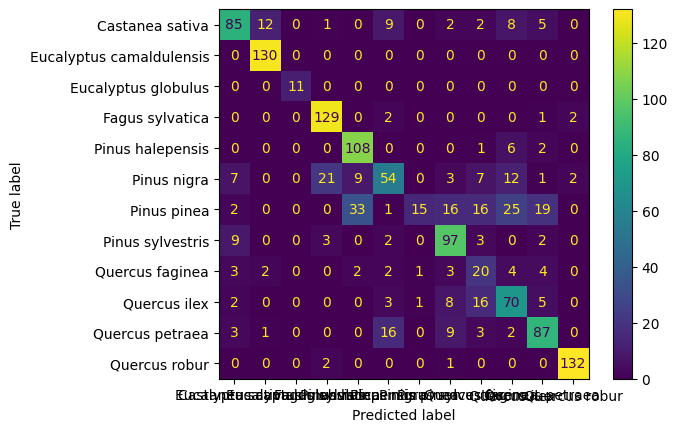

In [15]:
# Get the pixels from the orthomosaic
clf = clf.fit(X_train, y_train)
clf.score(X_test, y_test)
test_score = clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print(test_score, y_pred)

# Also do a decision tree classifier
pred = clf.predict(X_test)
cm = confusion_matrix(y_test, pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()
plt.show()



In [19]:
pd.read_csv(f'{data_dir}tallo_neon_species_dedup_subsample.csv')

FileNotFoundError: [Errno 2] No such file or directory: '../data/tallo/planetscope/tallo_neon_species_dedup_subsample.csv'

In [17]:
pickle.dumps(os.path.join(data_dir, f'classifier_tallo_pretrained.pkl'))

b'\x80\x04\x95=\x00\x00\x00\x00\x00\x00\x00\x8c9../data/tallo/planetscope/classifier_tallo_pretrained.pkl\x94.'

--------------------------------------------------------------------------------
left edge coord:	483501.0	
bottom edge coord:	5096040.0	
right edge coord:	483990.0	
top edge coord:	5096544.0	
dataset width:	163	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 483501.00|
| 0.00,-3.00, 5096544.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_496860 ../data/tallo/planetscope/sat_data/205329a8-65d5-493a-b55f-1b905b217aaa/PSScene/20220715_092201_89_2430_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


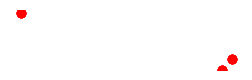

--------------------------------------------------------------------------------
left edge coord:	491253.0	
bottom edge coord:	5103801.0	
right edge coord:	491739.0	
top edge coord:	5104305.0	
dataset width:	162	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 491253.00|
| 0.00,-3.00, 5104305.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_497005 ../data/tallo/planetscope/sat_data/97ad3efd-0200-4313-917f-7b1c65243d93/PSScene/20220731_091842_58_2464_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


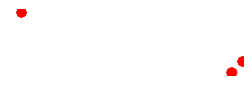

--------------------------------------------------------------------------------
left edge coord:	334416.0	
bottom edge coord:	5138256.0	
right edge coord:	334914.0	
top edge coord:	5138775.0	
dataset width:	166	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 334416.00|
| 0.00,-3.00, 5138775.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_496903 ../data/tallo/planetscope/sat_data/7887de72-9abc-4471-95ee-29c7ad7ab3ed/PSScene/20220717_093452_75_2235_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


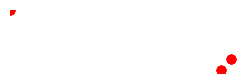

--------------------------------------------------------------------------------
left edge coord:	627357.0	
bottom edge coord:	6217872.0	
right edge coord:	627945.0	
top edge coord:	6218382.0	
dataset width:	196	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 627357.00|
| 0.00,-3.00, 6218382.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_390917 ../data/tallo/planetscope/sat_data/56ab7622-ea90-46cc-8858-630fd28d432b/PSScene/20221218_230804_14_2459_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus camaldulensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


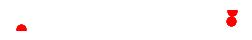

--------------------------------------------------------------------------------
left edge coord:	639990.0	
bottom edge coord:	6358545.0	
right edge coord:	640587.0	
top edge coord:	6359058.0	
dataset width:	199	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 639990.00|
| 0.00,-3.00, 6359058.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_327763 ../data/tallo/planetscope/sat_data/af03ac5c-67de-4c74-aa2f-04744d09110c/PSScene/20221225_231035_90_2464_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus camaldulensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


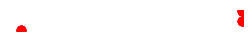

--------------------------------------------------------------------------------
left edge coord:	566106.0	
bottom edge coord:	6503433.0	
right edge coord:	566703.0	
top edge coord:	6503940.0	
dataset width:	199	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32750	
data transform
	| 3.00, 0.00, 566106.00|
| 0.00,-3.00, 6503940.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_330648 ../data/tallo/planetscope/sat_data/69f52d46-951a-4b99-991a-a8c862eef0c1/PSScene/20221230_011616_53_2465_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus camaldulensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


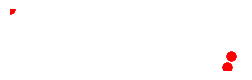

--------------------------------------------------------------------------------
left edge coord:	479958.0	
bottom edge coord:	5242659.0	
right edge coord:	480471.0	
top edge coord:	5243163.0	
dataset width:	171	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 479958.00|
| 0.00,-3.00, 5243163.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_498779 ../data/tallo/planetscope/sat_data/e4f78ad4-f367-4211-844d-dc75b0bdbd84/PSScene/20230113_230924_81_241e_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus globulus
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


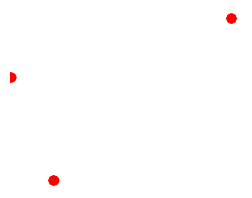

--------------------------------------------------------------------------------
left edge coord:	548805.0	
bottom edge coord:	5260968.0	
right edge coord:	549321.0	
top edge coord:	5261472.0	
dataset width:	172	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 548805.00|
| 0.00,-3.00, 5261472.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_332054 ../data/tallo/planetscope/sat_data/7ff0b6f0-ac10-4441-9f31-5eaff752f8c7/PSScene/20221226_230459_63_2465_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus globulus
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


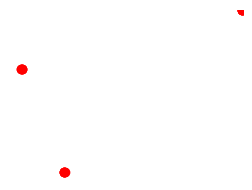

--------------------------------------------------------------------------------
left edge coord:	425742.0	
bottom edge coord:	5858121.0	
right edge coord:	426174.0	
top edge coord:	5858631.0	
dataset width:	144	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 425742.00|
| 0.00,-3.00, 5858631.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_385596 ../data/tallo/planetscope/sat_data/112da36e-77ea-4bc4-ba68-d47cb1496f1f/PSScene/20220627_090602_59_2455_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


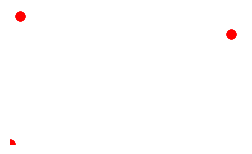

--------------------------------------------------------------------------------
left edge coord:	589614.0	
bottom edge coord:	6104343.0	
right edge coord:	590028.0	
top edge coord:	6104853.0	
dataset width:	138	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 589614.00|
| 0.00,-3.00, 6104853.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_116468 ../data/tallo/planetscope/sat_data/e9954051-7d61-41b5-915d-a2e55fd10f05/PSScene/20220722_083509_20_2428_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


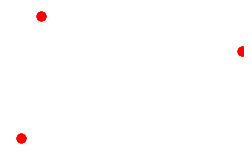

--------------------------------------------------------------------------------
left edge coord:	449280.0	
bottom edge coord:	6173730.0	
right edge coord:	449682.0	
top edge coord:	6174240.0	
dataset width:	134	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 449280.00|
| 0.00,-3.00, 6174240.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_114569 ../data/tallo/planetscope/sat_data/8cc1cb2e-dd54-44c1-8621-0b3068d653e9/PSScene/20230514_090811_35_2449_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


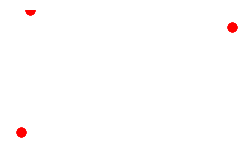

--------------------------------------------------------------------------------
left edge coord:	606780.0	
bottom edge coord:	4427700.0	
right edge coord:	607323.0	
top edge coord:	4428210.0	
dataset width:	181	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 606780.00|
| 0.00,-3.00, 4428210.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_271641 ../data/tallo/planetscope/sat_data/ac309268-208c-46bd-8eda-749131854abf/PSScene/20220621_093201_88_2435_3B_AnalyticMS_SR_8b_clip.tif Pinus halepensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


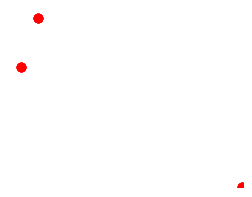

--------------------------------------------------------------------------------
left edge coord:	321762.0	
bottom edge coord:	4581759.0	
right edge coord:	322299.0	
top edge coord:	4582275.0	
dataset width:	179	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 321762.00|
| 0.00,-3.00, 4582275.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_229086 ../data/tallo/planetscope/sat_data/ea05bbfc-4079-4651-bad1-17d30326cef7/PSScene/20220713_094524_71_2460_3B_AnalyticMS_SR_8b_clip.tif Pinus halepensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


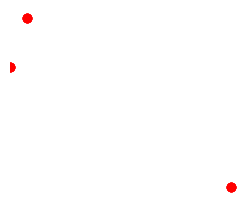

--------------------------------------------------------------------------------
left edge coord:	343728.0	
bottom edge coord:	4644792.0	
right edge coord:	344259.0	
top edge coord:	4645308.0	
dataset width:	177	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 343728.00|
| 0.00,-3.00, 4645308.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_246928 ../data/tallo/planetscope/sat_data/0e9a833a-7dc4-4a35-a03b-2cca65004d70/PSScene/20220713_094515_54_2460_3B_AnalyticMS_SR_8b_clip.tif Pinus halepensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


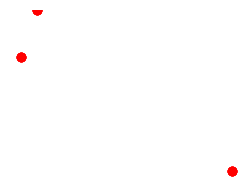

--------------------------------------------------------------------------------
left edge coord:	357780.0	
bottom edge coord:	4646718.0	
right edge coord:	358311.0	
top edge coord:	4647234.0	
dataset width:	177	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 357780.00|
| 0.00,-3.00, 4647234.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_248769 ../data/tallo/planetscope/sat_data/c0ecd39d-b121-4237-93e3-4c5d604e9e52/PSScene/20220615_094548_18_2428_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


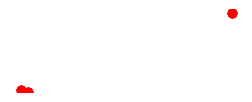

--------------------------------------------------------------------------------
left edge coord:	760440.0	
bottom edge coord:	4672659.0	
right edge coord:	760977.0	
top edge coord:	4673181.0	
dataset width:	179	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32630	
data transform
	| 3.00, 0.00, 760440.00|
| 0.00,-3.00, 4673181.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_229579 ../data/tallo/planetscope/sat_data/2b8adeca-ee79-4ffd-ba0a-fdefc2c02e90/PSScene/20220726_094935_19_2463_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


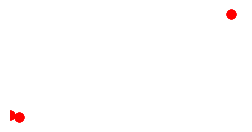

--------------------------------------------------------------------------------
left edge coord:	469008.0	
bottom edge coord:	5138316.0	
right edge coord:	469494.0	
top edge coord:	5138823.0	
dataset width:	162	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32636	
data transform
	| 3.00, 0.00, 469008.00|
| 0.00,-3.00, 5138823.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342146 ../data/tallo/planetscope/sat_data/f1d22bfa-873b-4e43-9a4b-e885cbfb94e7/PSScene/20220619_074626_82_2430_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
left edge coord:	406755.0	
bottom edge coord:	4626699.0	
right edge coord:	407286.0	
top edge coord:	4627209.0	
dataset width:	177	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 406755.00|
| 0.00,-3.00, 4627209.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_251805 ../data/tallo/planetscope/sat_data/8463c192-e4f8-4632-8a55-e46a44adc5d9/PSScene/20220803_094107_38_2451_3B_AnalyticMS_SR_8b_clip.tif Pinus pinea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


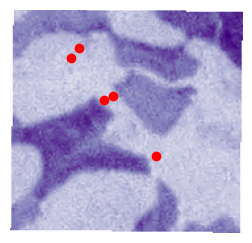

--------------------------------------------------------------------------------
left edge coord:	690474.0	
bottom edge coord:	5539317.0	
right edge coord:	690945.0	
top edge coord:	5539836.0	
dataset width:	157	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 690474.00|
| 0.00,-3.00, 5539836.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_119451 ../data/tallo/planetscope/sat_data/b5165857-908a-4637-a99e-c1cdfac1a34d/PSScene/20230506_082424_05_2430_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


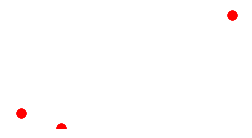

--------------------------------------------------------------------------------
left edge coord:	406032.0	
bottom edge coord:	5770341.0	
right edge coord:	406473.0	
top edge coord:	5770854.0	
dataset width:	147	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 406032.00|
| 0.00,-3.00, 5770854.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_113959 ../data/tallo/planetscope/sat_data/a0ee8aec-7b8a-4b59-a785-65be076c9c9d/PSScene/20220627_090613_94_2455_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


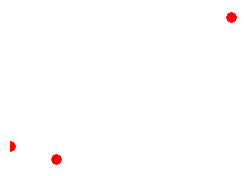

--------------------------------------------------------------------------------
left edge coord:	405045.0	
bottom edge coord:	6151200.0	
right edge coord:	405453.0	
top edge coord:	6151713.0	
dataset width:	136	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 405045.00|
| 0.00,-3.00, 6151713.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_343226 ../data/tallo/planetscope/sat_data/3c362d70-b916-450a-967f-02212d8f74c9/PSScene/20230611_051422_39_241f_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


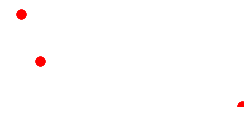

--------------------------------------------------------------------------------
left edge coord:	400761.0	
bottom edge coord:	4613787.0	
right edge coord:	401289.0	
top edge coord:	4614297.0	
dataset width:	176	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 400761.00|
| 0.00,-3.00, 4614297.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_240435 ../data/tallo/planetscope/sat_data/c08159e0-bf34-4ba5-a305-d090b57f3cfc/PSScene/20220611_094231_01_2463_3B_AnalyticMS_SR_8b_clip.tif Quercus faginea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	10	
Now you have:	10	
--------------------------------------------------------------------------------


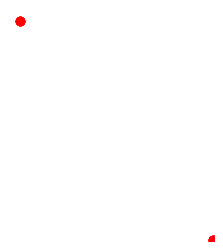

--------------------------------------------------------------------------------
left edge coord:	333759.0	
bottom edge coord:	4689792.0	
right edge coord:	334290.0	
top edge coord:	4690305.0	
dataset width:	177	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 333759.00|
| 0.00,-3.00, 4690305.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_213843 ../data/tallo/planetscope/sat_data/7681af08-2ba8-4fbd-87df-a57631ff8c39/PSScene/20220713_094510_95_2460_3B_AnalyticMS_SR_8b_clip.tif Quercus faginea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	10	
Now you have:	10	
--------------------------------------------------------------------------------


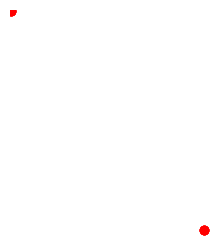

--------------------------------------------------------------------------------
left edge coord:	415257.0	
bottom edge coord:	3907341.0	
right edge coord:	415833.0	
top edge coord:	3907851.0	
dataset width:	192	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 415257.00|
| 0.00,-3.00, 3907851.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_171799 ../data/tallo/planetscope/sat_data/fba3f974-2351-49f5-af38-c2fff637a446/PSScene/20230622_045440_85_24cf_3B_AnalyticMS_SR_8b_clip.tif Quercus ilex
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


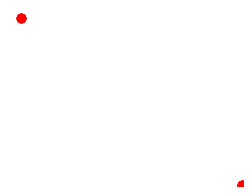

--------------------------------------------------------------------------------
left edge coord:	407373.0	
bottom edge coord:	3944910.0	
right edge coord:	407946.0	
top edge coord:	3945420.0	
dataset width:	191	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 407373.00|
| 0.00,-3.00, 3945420.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_167649 ../data/tallo/planetscope/sat_data/24a8ff65-f5da-466c-b310-8aa075b9bfa7/PSScene/20230620_043335_33_2445_3B_AnalyticMS_SR_8b_clip.tif Quercus ilex
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


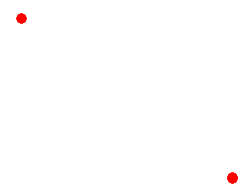

--------------------------------------------------------------------------------
left edge coord:	272778.0	
bottom edge coord:	4662708.0	
right edge coord:	273315.0	
top edge coord:	4663230.0	
dataset width:	179	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 272778.00|
| 0.00,-3.00, 4663230.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_234225 ../data/tallo/planetscope/sat_data/eb682f0f-3ac9-4cf5-b760-25a86e0dbce6/PSScene/20220711_095053_55_2465_3B_AnalyticMS_SR_8b_clip.tif Quercus ilex
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


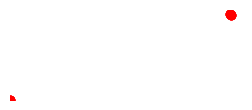

--------------------------------------------------------------------------------
left edge coord:	354759.0	
bottom edge coord:	4599795.0	
right edge coord:	355293.0	
top edge coord:	4600308.0	
dataset width:	178	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 354759.00|
| 0.00,-3.00, 4600308.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_222333 ../data/tallo/planetscope/sat_data/de00878c-6f22-4d29-9ce4-fb4cd0d3e3c5/PSScene/20220615_094555_59_2428_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


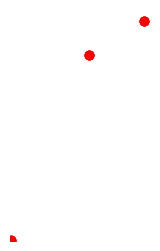

--------------------------------------------------------------------------------
left edge coord:	384783.0	
bottom edge coord:	4670778.0	
right edge coord:	385311.0	
top edge coord:	4671288.0	
dataset width:	176	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 384783.00|
| 0.00,-3.00, 4671288.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_287351 ../data/tallo/planetscope/sat_data/e78d52e2-8f1d-4f0a-9e62-44b622af5e8c/PSScene/20230625_094229_51_2451_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


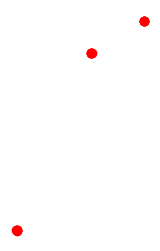

--------------------------------------------------------------------------------
left edge coord:	405774.0	
bottom edge coord:	4683792.0	
right edge coord:	406299.0	
top edge coord:	4684302.0	
dataset width:	175	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 405774.00|
| 0.00,-3.00, 4684302.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_267784 ../data/tallo/planetscope/sat_data/fe1db68e-ff6b-482f-9bcf-f1a671a64948/PSScene/20230625_094227_36_2451_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	15	
Now you have:	15	
--------------------------------------------------------------------------------


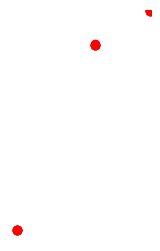

--------------------------------------------------------------------------------
left edge coord:	473487.0	
bottom edge coord:	5909358.0	
right edge coord:	473907.0	
top edge coord:	5909865.0	
dataset width:	140	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 473487.00|
| 0.00,-3.00, 5909865.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_114789 ../data/tallo/planetscope/sat_data/9eafc70a-34f1-4016-9fb4-8aebce16e528/PSScene/20230609_090751_75_241e_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	10	
Now you have:	10	
--------------------------------------------------------------------------------


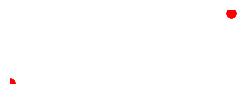

--------------------------------------------------------------------------------
left edge coord:	372918.0	
bottom edge coord:	6133077.0	
right edge coord:	373332.0	
top edge coord:	6133593.0	
dataset width:	138	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32637	
data transform
	| 3.00, 0.00, 372918.00|
| 0.00,-3.00, 6133593.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342238 ../data/tallo/planetscope/sat_data/7b7c4988-54c9-4086-9a3d-dba5c3b45dfd/PSScene/20220624_074058_26_2421_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	10	
Now you have:	10	
--------------------------------------------------------------------------------


In [81]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

plt.rcParams['svg.fonttype'] = 'none'
t_ids = df['tree_id'].values
fig_dir = f'{data_dir}fig/'
n = 3

for i, img_path in enumerate(df['path'].values):
    if img_path != None:
        o = Image()
        o.load_image(image_path=img_path)
        species = df['species'].values[i]
        print(t_ids[i], img_path, df['species'].values[i])
        c = Coords(f'{data_dir}coords/{species}.csv', x_col='lat', y_col='lon', label_col='id',
               id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
        c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=False)
        c.plot_on_image(o)
        plt.show()

--------------------------------------------------------------------------------
left edge coord:	483501.0	
bottom edge coord:	5096040.0	
right edge coord:	483990.0	
top edge coord:	5096544.0	
dataset width:	163	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 483501.00|
| 0.00,-3.00, 5096544.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_496860 ../data/tallo/planetscope/sat_data/205329a8-65d5-493a-b55f-1b905b217aaa/PSScene/20220715_092201_89_2430_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------
-----------------------------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	449280.0	
bottom edge coord:	6173730.0	
right edge coord:	449682.0	
top edge coord:	6174240.0	
dataset width:	134	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 449280.00|
| 0.00,-3.00, 6174240.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_114569 ../data/tallo/planetscope/sat_data/8cc1cb2e-dd54-44c1-8621-0b3068d653e9/PSScene/20230514_090811_35_2449_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------
-----------------------------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	405045.0	
bottom edge coord:	6151200.0	
right edge coord:	405453.0	
top edge coord:	6151713.0	
dataset width:	136	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 405045.00|
| 0.00,-3.00, 6151713.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_343226 ../data/tallo/planetscope/sat_data/3c362d70-b916-450a-967f-02212d8f74c9/PSScene/20230611_051422_39_241f_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------
----------------------------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	372918.0	
bottom edge coord:	6133077.0	
right edge coord:	373332.0	
top edge coord:	6133593.0	
dataset width:	138	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32637	
data transform
	| 3.00, 0.00, 372918.00|
| 0.00,-3.00, 6133593.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342238 ../data/tallo/planetscope/sat_data/7b7c4988-54c9-4086-9a3d-dba5c3b45dfd/PSScene/20220624_074058_26_2421_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


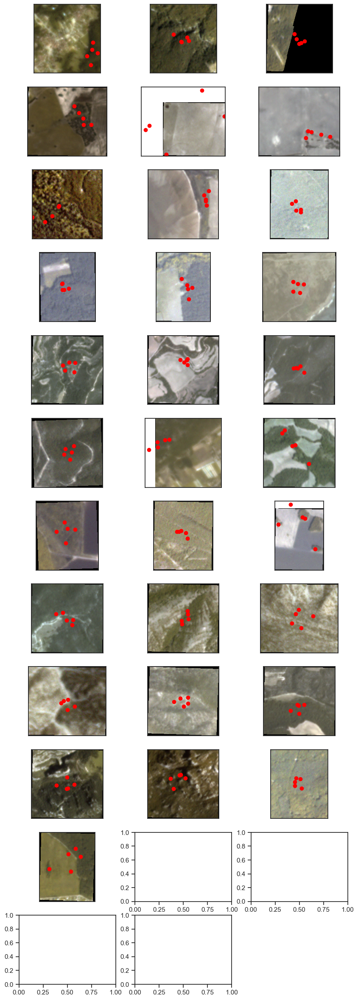

In [53]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

plt.rcParams['svg.fonttype'] = 'none'
t_ids = df['tree_id'].values
fig_dir = f'{data_dir}fig/'
n = 3
fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

axs = axs.ravel()
axi = 0

for i, img_path in enumerate(df['path'].values):
    if img_path != None:
        o = Image()
        o.load_image(image_path=img_path)
        print(t_ids[i], img_path, df['species'].values[i])
        c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
               id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
        c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=False)
        ax = o.plot_rbg(axs[axi])
        c.plot_on_ax(ax, o)
        ax.set_yticks([])
        ax.set_xticks([])
        axi += 1
plt.axis('off')
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)

plt.savefig(f'{fig_dir}Figure2_planetscope_annotation.svg')
plt.show()


# Now for each species we want to get what its bands filter is

1. Calculate the filter for each of the species then we can also just plot the average differences 


In [121]:
t_df

""


In [67]:
def calcualte_average_indicies(coords, img, output_dir='', label='', save_avg=True, 
                               bands=[1, 2, 3, 4, 5, 6, 7, 8]):
    image_bands = []
    for band in bands: 
        image_bands.append(o.image.read(band)) 

    nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar = get_all_planetscope(img)
    df = coords.df
    xs = coords.df[coords.x_col].values
    ys = coords.df[coords.y_col].values
    rows = []
    info_cols = image_bands + [nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar]
    for i, id_val in enumerate(df[coords.id_col].values):
        try:
            rows.append([coords.id_col] + get_values_for_location(o, xs[i], ys[i], info_cols))
        except:
            xse = 1

    columns = [coords.id_col] + [f'band_{i}' for i in bands]
    columns += ['nitian', 'ndvi', 'sr', 'tvi', 'gi', 'gndvi', 'pri', 'osavi', 'tcari', 'redge', 'redge2',
                'siredge', 'normg', 'schl', 'schlcar']

    if save_avg:
        ind_df = pd.DataFrame(data=rows, columns=columns)
        ind_df.to_csv(f'{output_dir}calculated_indicies_{label}.csv', index=False)

    # Create a mask
    masking_cols = [f'band_{i}' for i in bands] + ['nitian', 'ndvi', 'sr', 'tvi', 'gi', 'gndvi', 'pri', 'osavi', 'tcari', 'redge', 'redge2',
                'siredge', 'normg', 'schl', 'schlcar']
    info_cols = image_bands + [nitian, ndvi, sr, tvi, gi, gndvi, pri, osavi, tcari, redge, redge2, siredge, normg, schl, schlcar]
    return masking_cols[8:-2], info_cols[8:-2], ndvi

--------------------------------------------------------------------------------
left edge coord:	483501.0	
bottom edge coord:	5096040.0	
right edge coord:	483990.0	
top edge coord:	5096544.0	
dataset width:	163	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 483501.00|
| 0.00,-3.00, 5096544.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

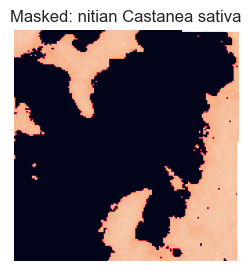

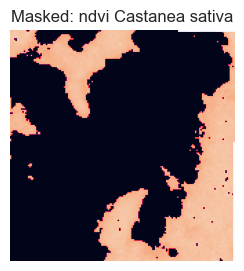

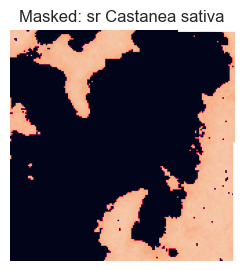

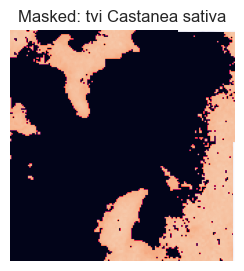

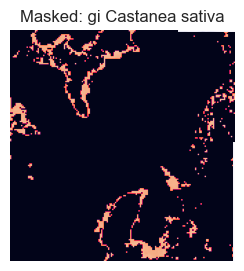

...

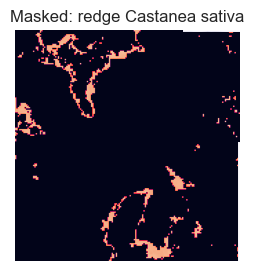

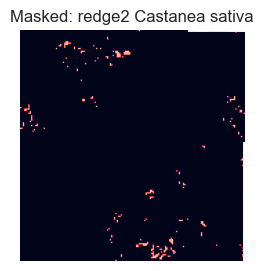

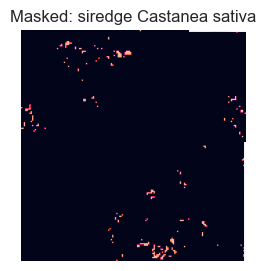

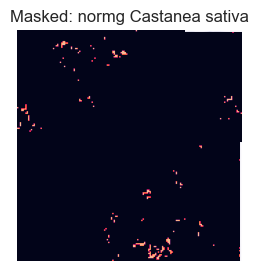

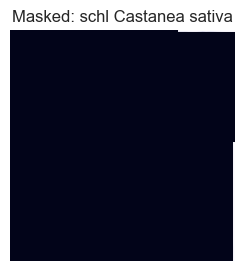

--------------------------------------------------------------------------------
left edge coord:	491253.0	
bottom edge coord:	5103801.0	
right edge coord:	491739.0	
top edge coord:	5104305.0	
dataset width:	162	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 491253.00|
| 0.00,-3.00, 5104305.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


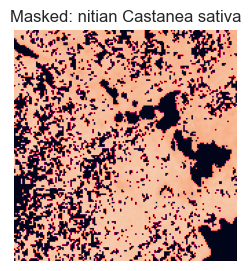

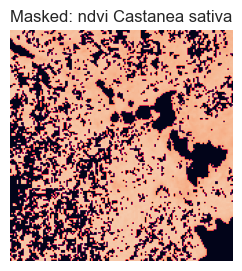

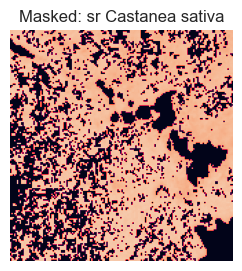

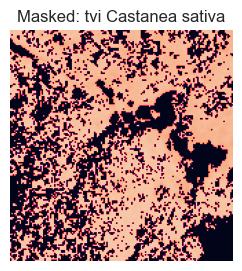

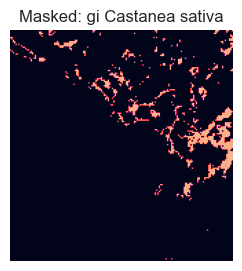

...

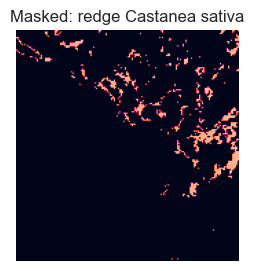

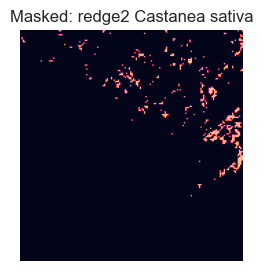

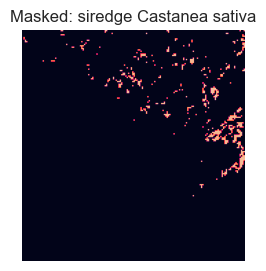

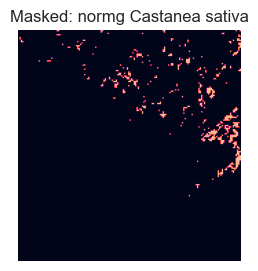

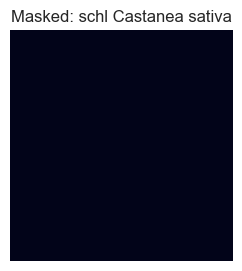

--------------------------------------------------------------------------------
left edge coord:	334416.0	
bottom edge coord:	5138256.0	
right edge coord:	334914.0	
top edge coord:	5138775.0	
dataset width:	166	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 334416.00|
| 0.00,-3.00, 5138775.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

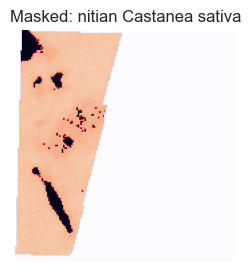

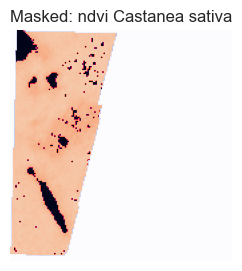

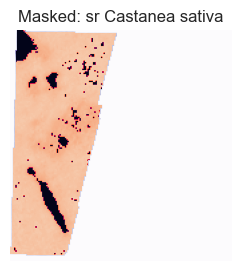

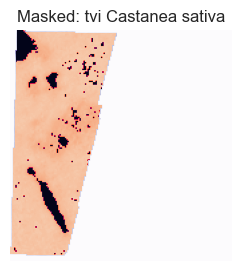

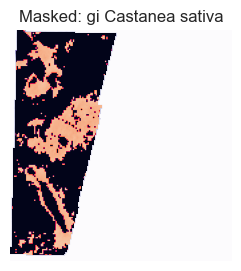

...

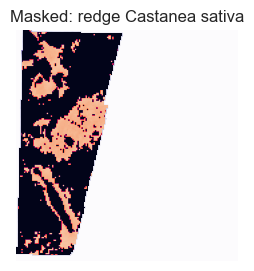

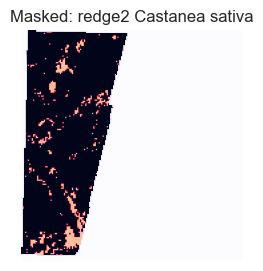

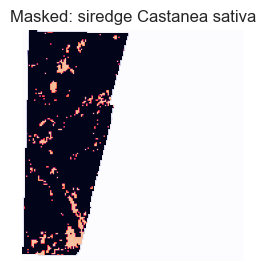

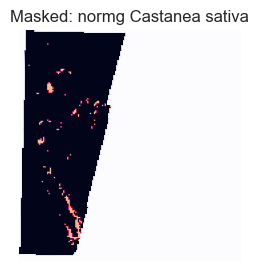

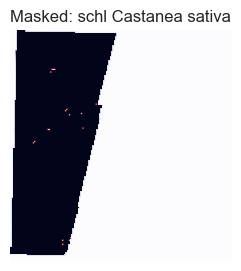

--------------------------------------------------------------------------------
left edge coord:	627357.0	
bottom edge coord:	6217872.0	
right edge coord:	627945.0	
top edge coord:	6218382.0	
dataset width:	196	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 627357.00|
| 0.00,-3.00, 6218382.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

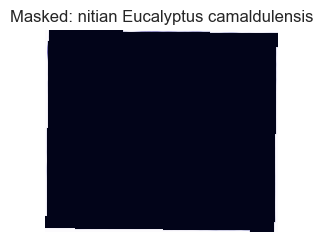

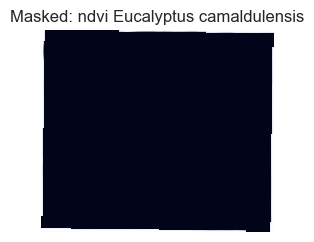

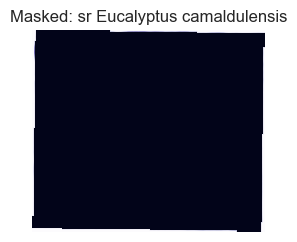

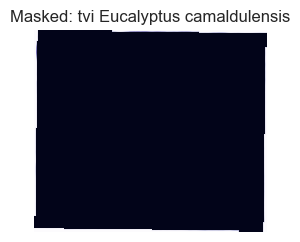

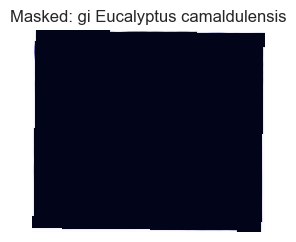

...

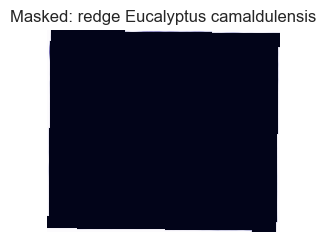

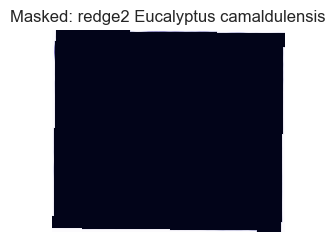

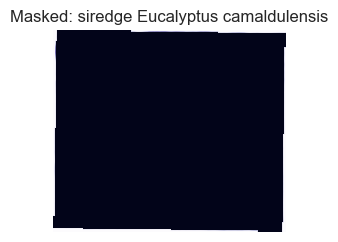

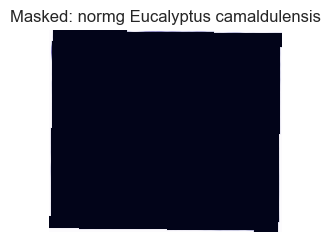

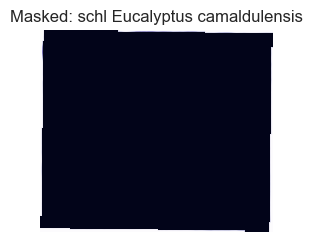

--------------------------------------------------------------------------------
left edge coord:	639990.0	
bottom edge coord:	6358545.0	
right edge coord:	640587.0	
top edge coord:	6359058.0	
dataset width:	199	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 639990.00|
| 0.00,-3.00, 6359058.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

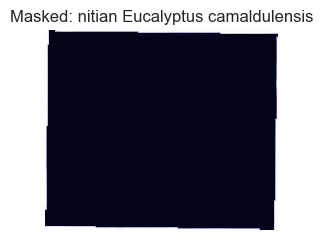

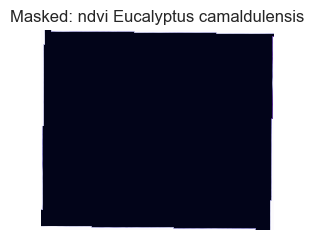

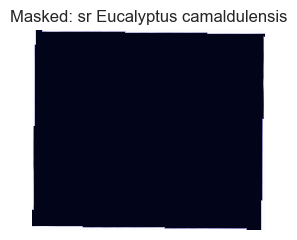

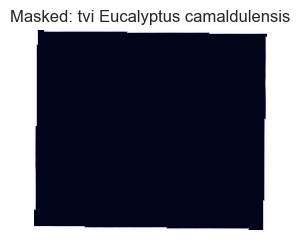

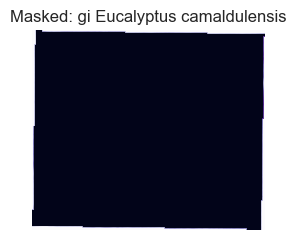

...

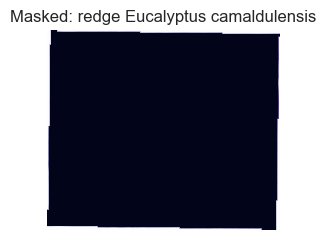

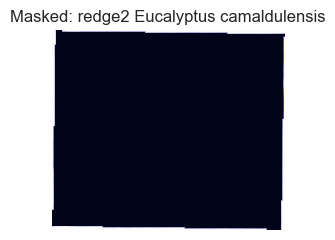

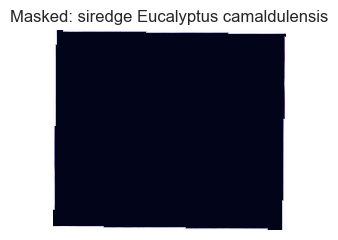

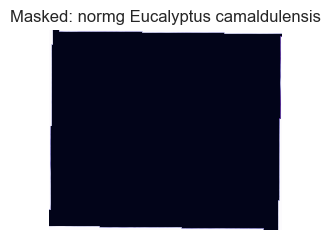

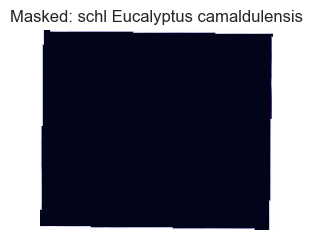

--------------------------------------------------------------------------------
left edge coord:	566106.0	
bottom edge coord:	6503433.0	
right edge coord:	566703.0	
top edge coord:	6503940.0	
dataset width:	199	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32750	
data transform
	| 3.00, 0.00, 566106.00|
| 0.00,-3.00, 6503940.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

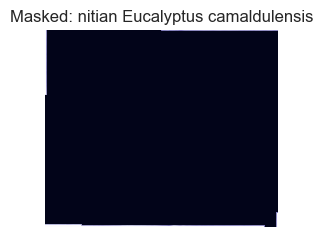

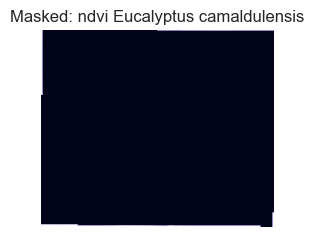

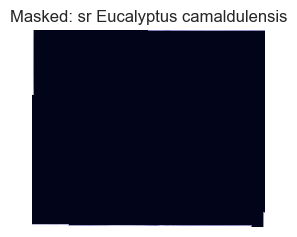

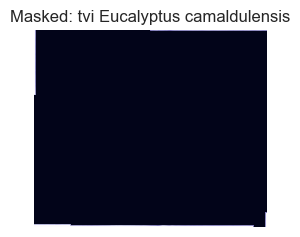

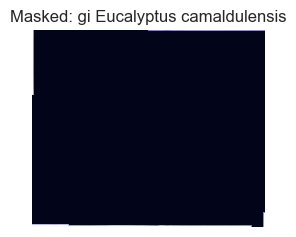

...

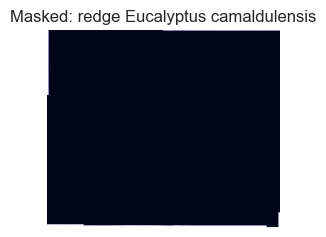

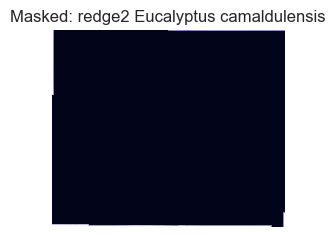

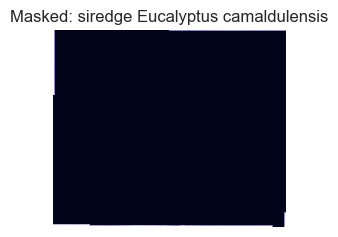

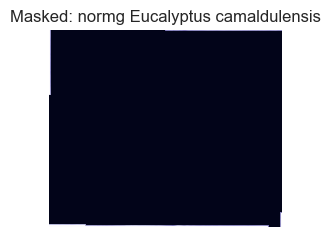

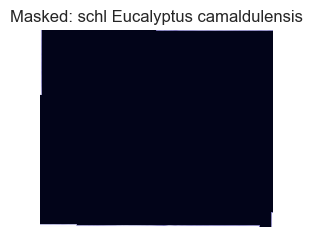

--------------------------------------------------------------------------------
left edge coord:	479958.0	
bottom edge coord:	5242659.0	
right edge coord:	480471.0	
top edge coord:	5243163.0	
dataset width:	171	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 479958.00|
| 0.00,-3.00, 5243163.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

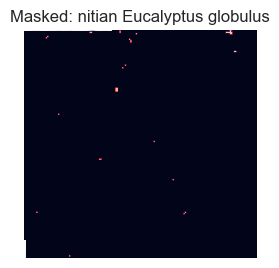

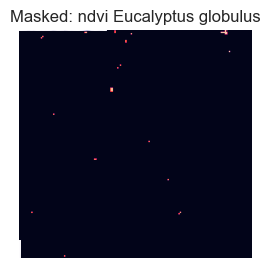

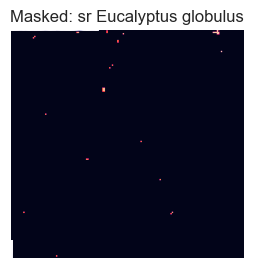

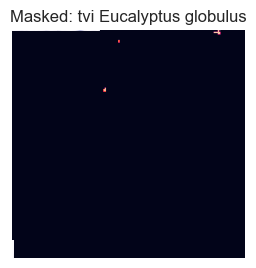

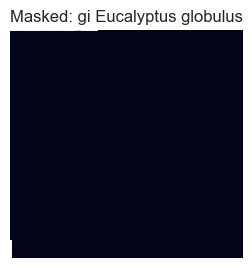

...

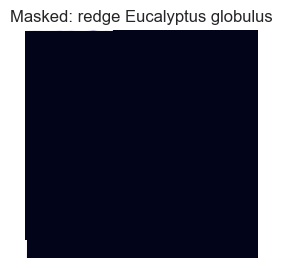

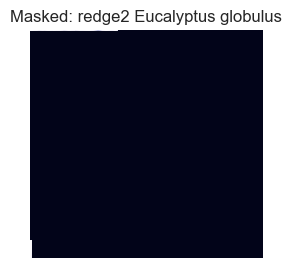

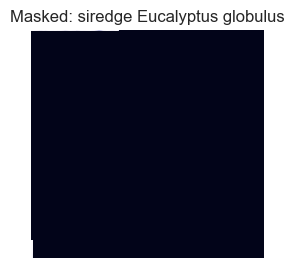

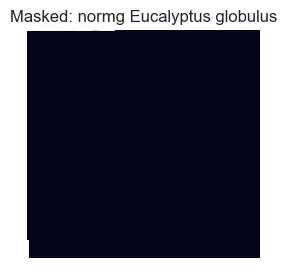

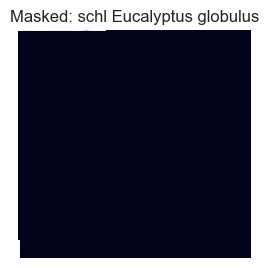

--------------------------------------------------------------------------------
left edge coord:	548805.0	
bottom edge coord:	5260968.0	
right edge coord:	549321.0	
top edge coord:	5261472.0	
dataset width:	172	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 548805.00|
| 0.00,-3.00, 5261472.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

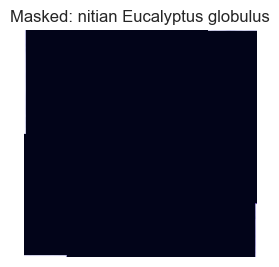

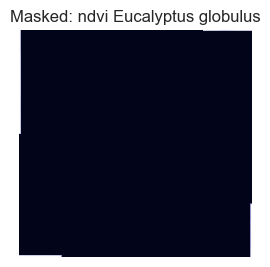

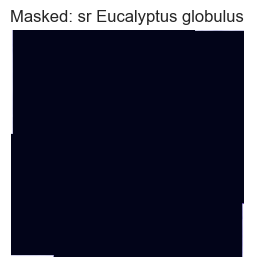

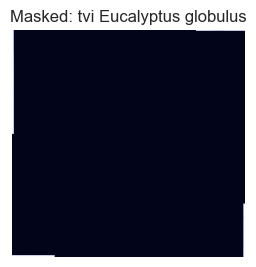

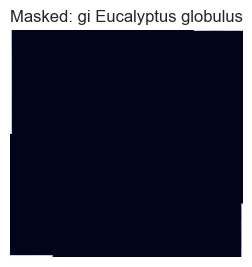

...

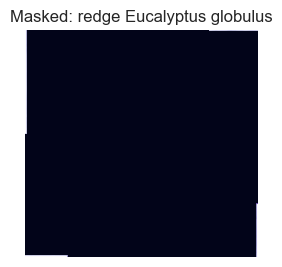

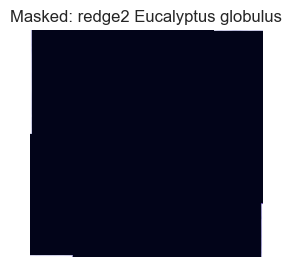

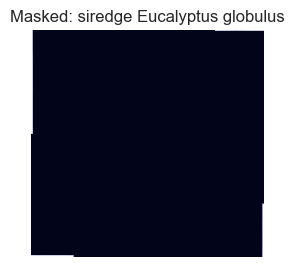

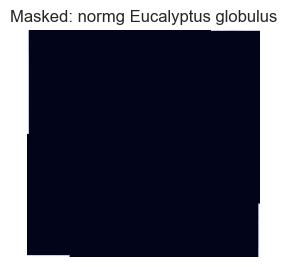

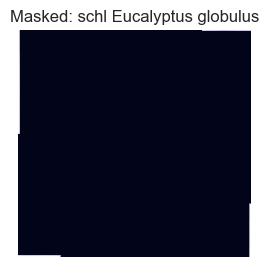

--------------------------------------------------------------------------------
left edge coord:	425742.0	
bottom edge coord:	5858121.0	
right edge coord:	426174.0	
top edge coord:	5858631.0	
dataset width:	144	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 425742.00|
| 0.00,-3.00, 5858631.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

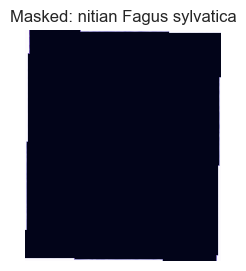

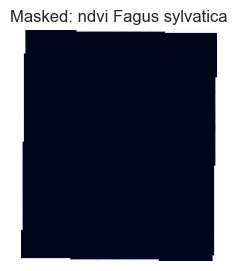

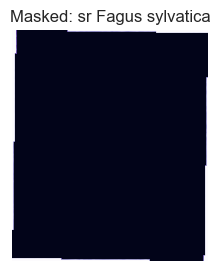

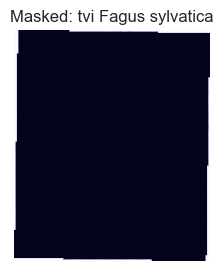

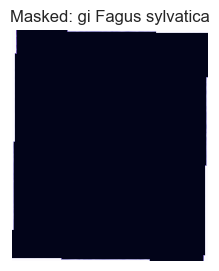

...

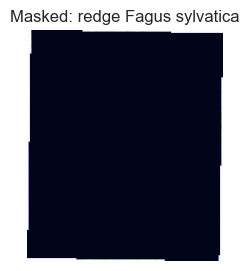

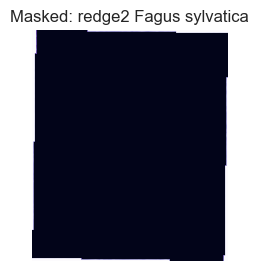

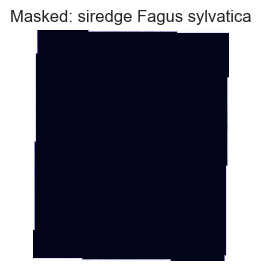

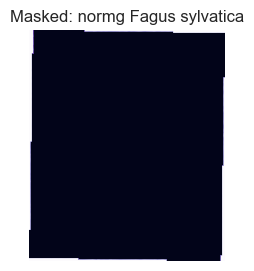

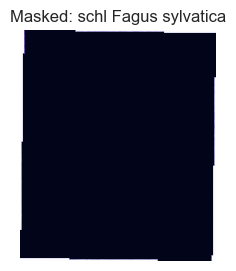

--------------------------------------------------------------------------------
left edge coord:	589614.0	
bottom edge coord:	6104343.0	
right edge coord:	590028.0	
top edge coord:	6104853.0	
dataset width:	138	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 589614.00|
| 0.00,-3.00, 6104853.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

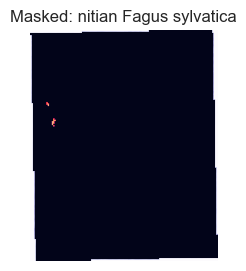

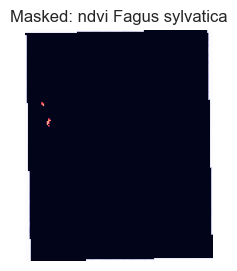

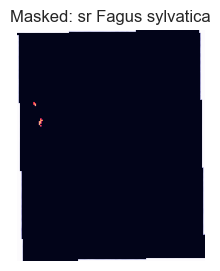

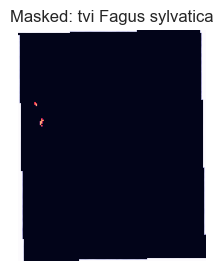

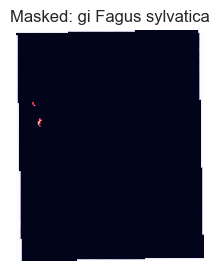

...

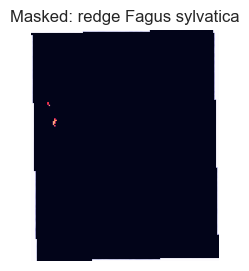

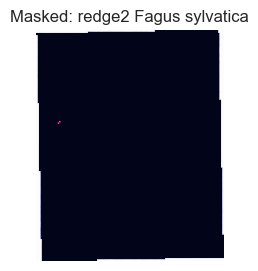

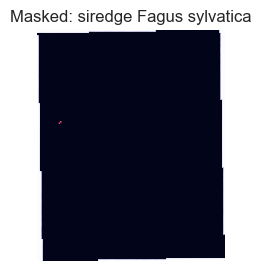

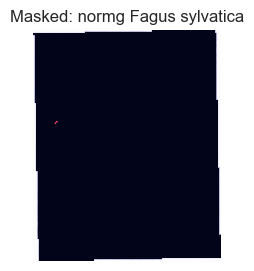

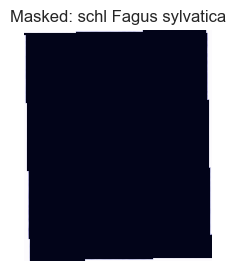

--------------------------------------------------------------------------------
left edge coord:	449280.0	
bottom edge coord:	6173730.0	
right edge coord:	449682.0	
top edge coord:	6174240.0	
dataset width:	134	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 449280.00|
| 0.00,-3.00, 6174240.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

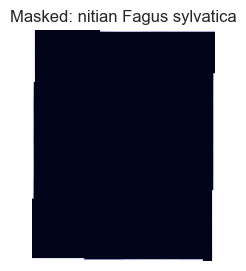

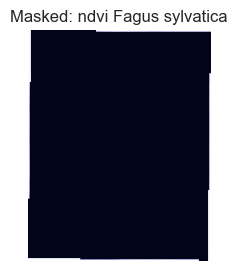

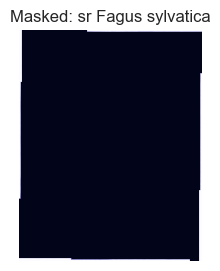

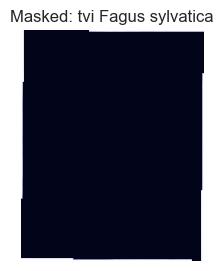

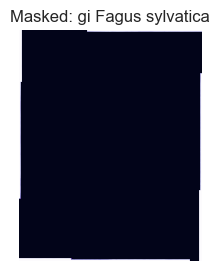

...

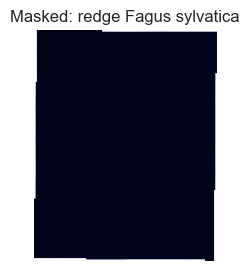

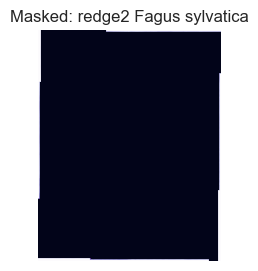

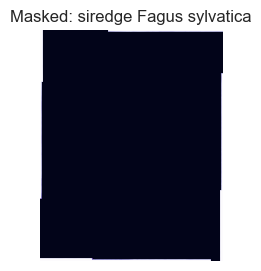

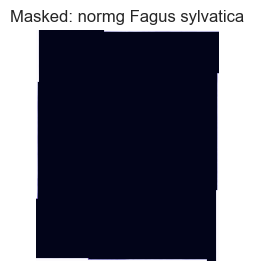

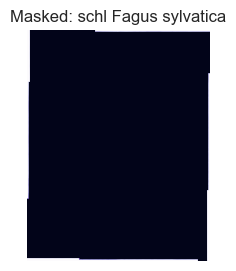

--------------------------------------------------------------------------------
left edge coord:	606780.0	
bottom edge coord:	4427700.0	
right edge coord:	607323.0	
top edge coord:	4428210.0	
dataset width:	181	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 606780.00|
| 0.00,-3.00, 4428210.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

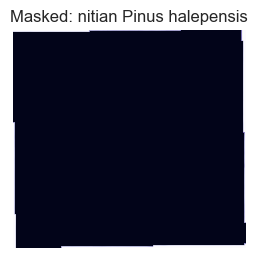

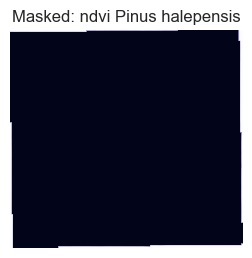

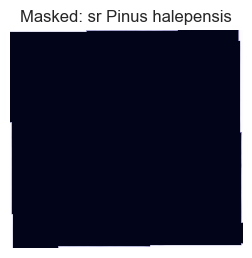

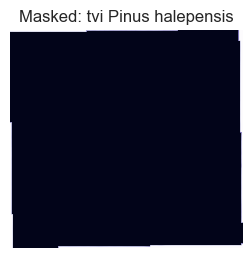

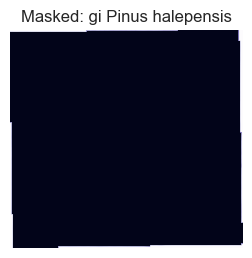

...

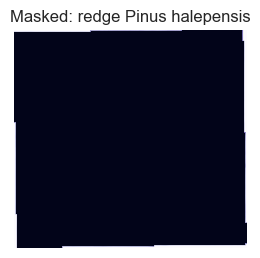

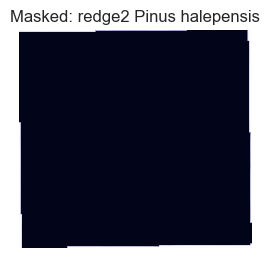

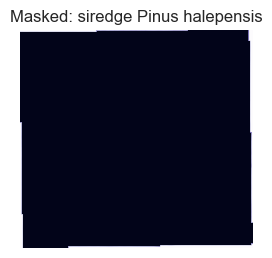

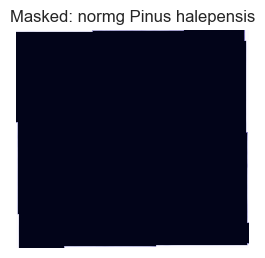

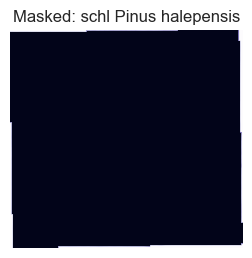

--------------------------------------------------------------------------------
left edge coord:	321762.0	
bottom edge coord:	4581759.0	
right edge coord:	322299.0	
top edge coord:	4582275.0	
dataset width:	179	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 321762.00|
| 0.00,-3.00, 4582275.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

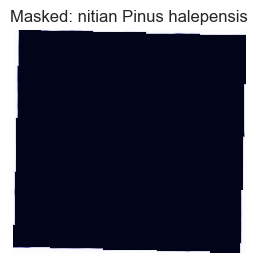

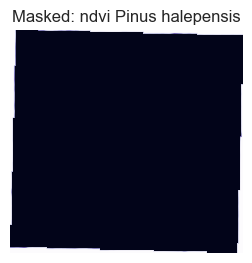

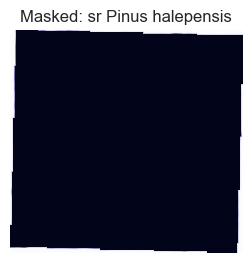

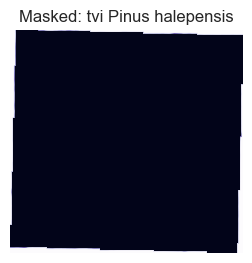

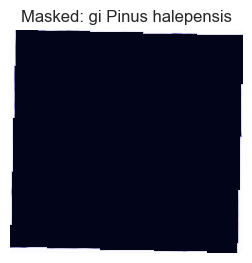

...

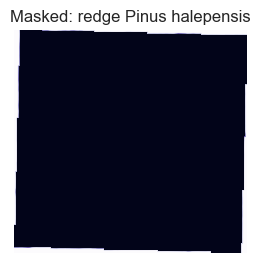

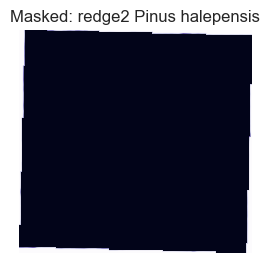

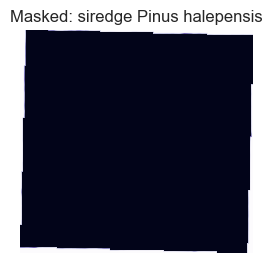

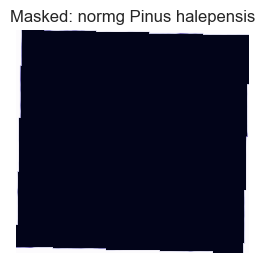

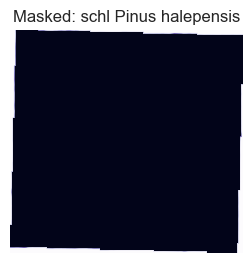

--------------------------------------------------------------------------------
left edge coord:	343728.0	
bottom edge coord:	4644792.0	
right edge coord:	344259.0	
top edge coord:	4645308.0	
dataset width:	177	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 343728.00|
| 0.00,-3.00, 4645308.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

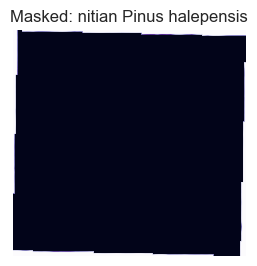

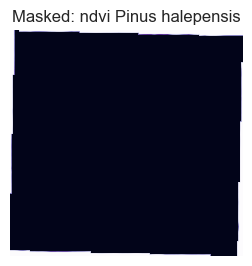

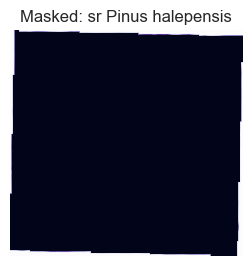

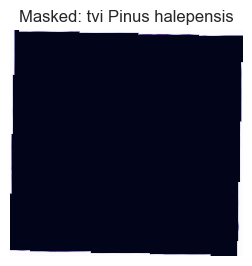

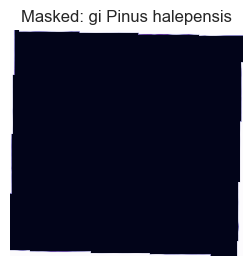

...

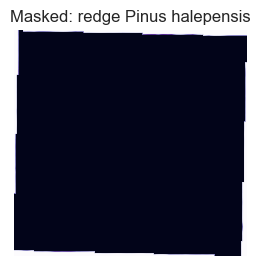

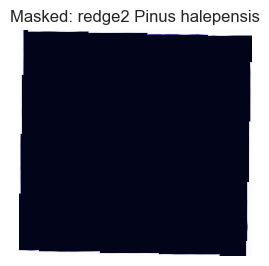

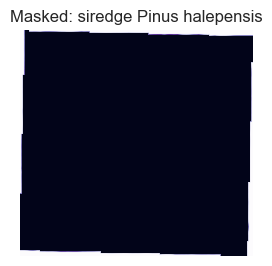

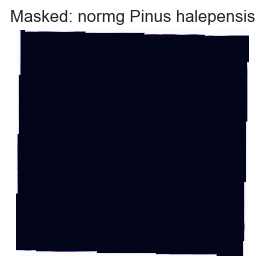

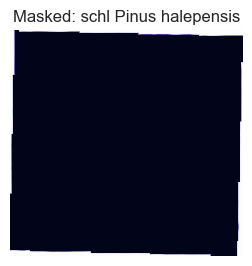

--------------------------------------------------------------------------------
left edge coord:	357780.0	
bottom edge coord:	4646718.0	
right edge coord:	358311.0	
top edge coord:	4647234.0	
dataset width:	177	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 357780.00|
| 0.00,-3.00, 4647234.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

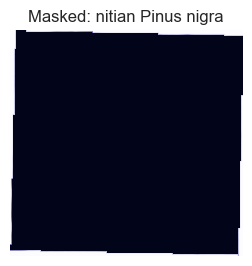

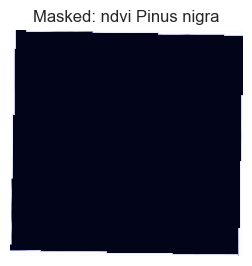

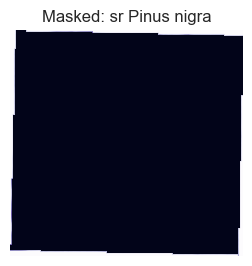

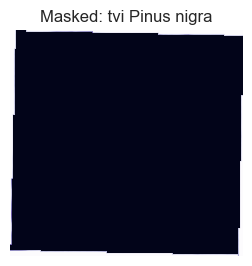

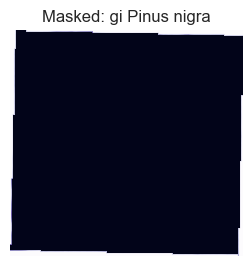

...

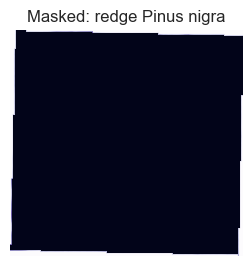

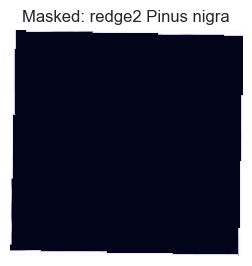

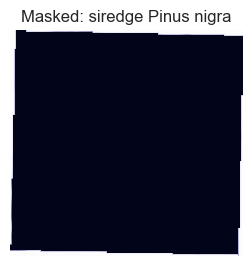

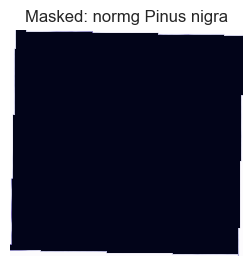

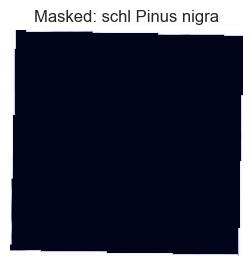

--------------------------------------------------------------------------------
left edge coord:	760440.0	
bottom edge coord:	4672659.0	
right edge coord:	760977.0	
top edge coord:	4673181.0	
dataset width:	179	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32630	
data transform
	| 3.00, 0.00, 760440.00|
| 0.00,-3.00, 4673181.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

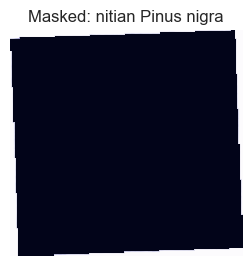

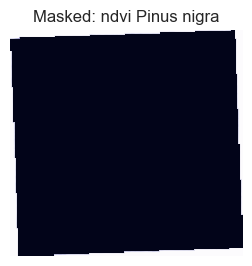

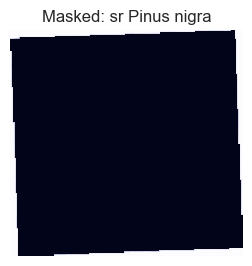

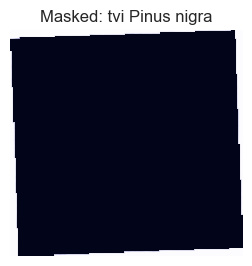

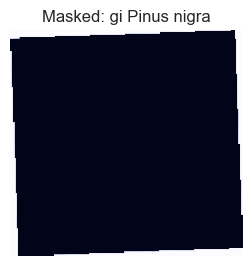

...

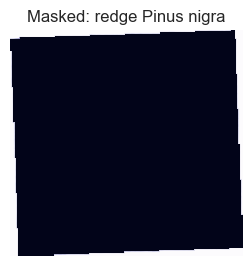

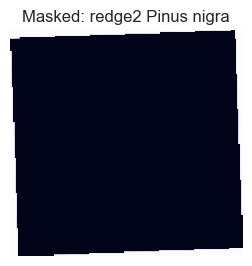

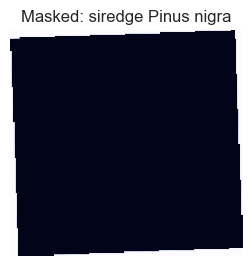

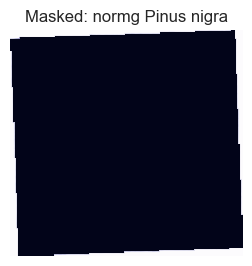

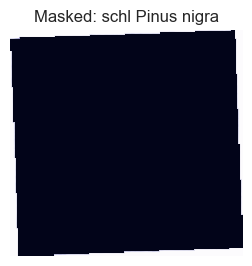

--------------------------------------------------------------------------------
left edge coord:	469008.0	
bottom edge coord:	5138316.0	
right edge coord:	469494.0	
top edge coord:	5138823.0	
dataset width:	162	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32636	
data transform
	| 3.00, 0.00, 469008.00|
| 0.00,-3.00, 5138823.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

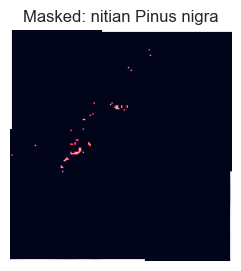

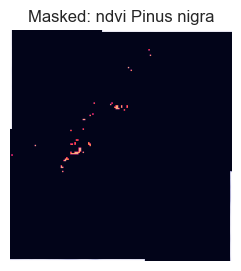

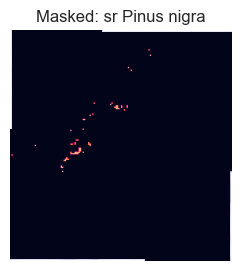

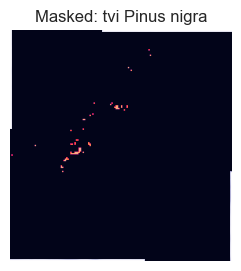

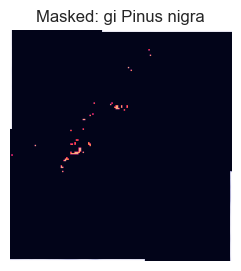

...

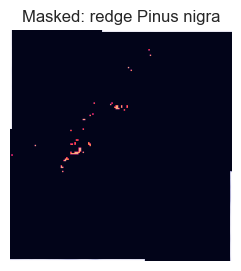

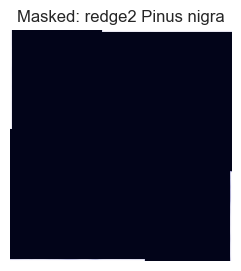

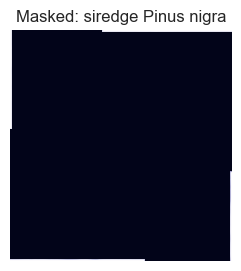

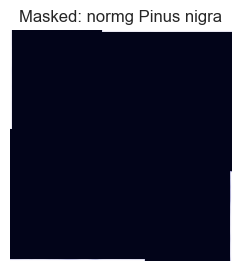

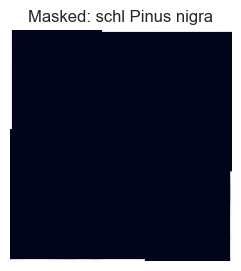

--------------------------------------------------------------------------------
left edge coord:	406755.0	
bottom edge coord:	4626699.0	
right edge coord:	407286.0	
top edge coord:	4627209.0	
dataset width:	177	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 406755.00|
| 0.00,-3.00, 4627209.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

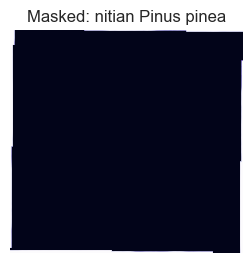

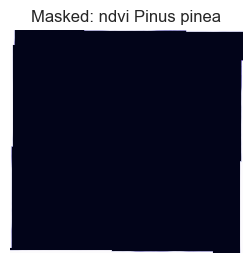

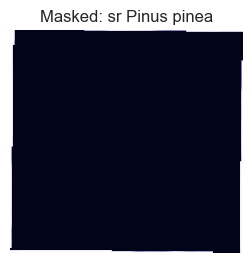

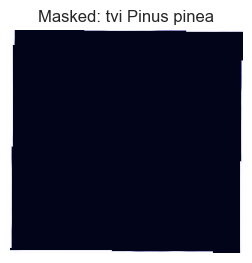

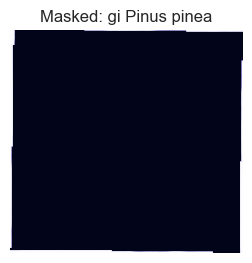

...

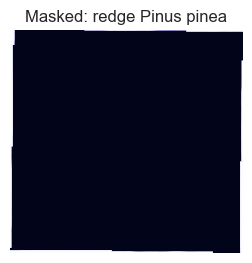

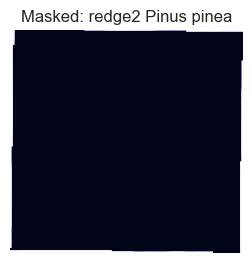

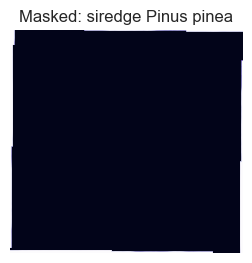

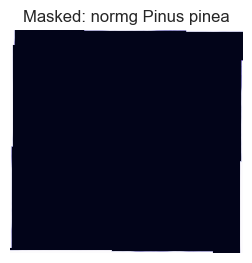

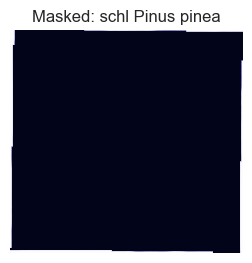

--------------------------------------------------------------------------------
left edge coord:	690474.0	
bottom edge coord:	5539317.0	
right edge coord:	690945.0	
top edge coord:	5539836.0	
dataset width:	157	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 690474.00|
| 0.00,-3.00, 5539836.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

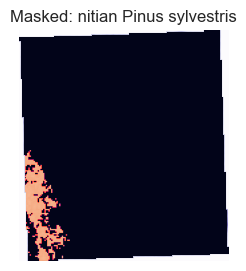

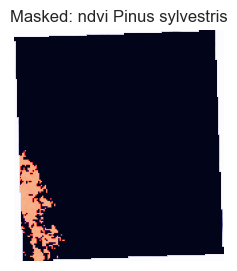

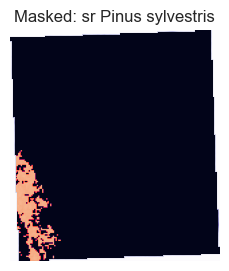

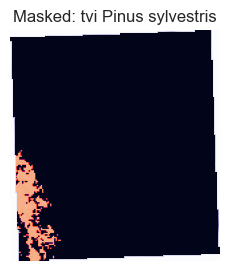

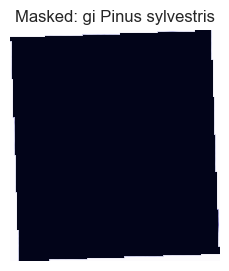

...

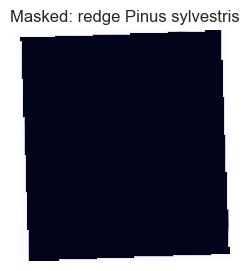

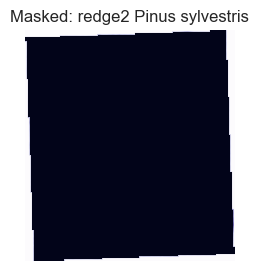

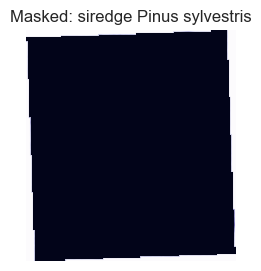

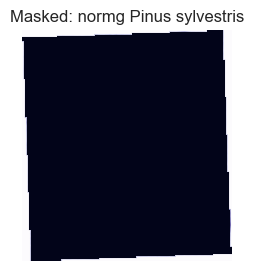

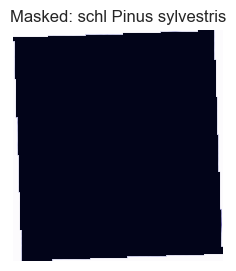

--------------------------------------------------------------------------------
left edge coord:	406032.0	
bottom edge coord:	5770341.0	
right edge coord:	406473.0	
top edge coord:	5770854.0	
dataset width:	147	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 406032.00|
| 0.00,-3.00, 5770854.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

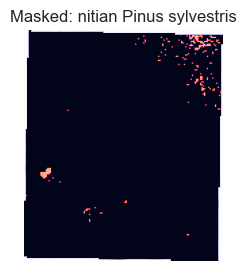

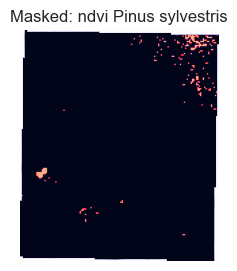

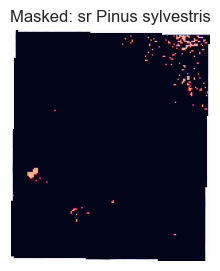

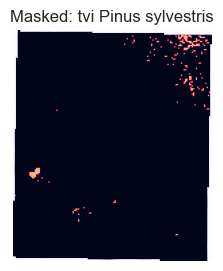

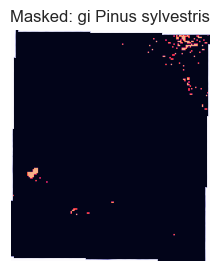

...

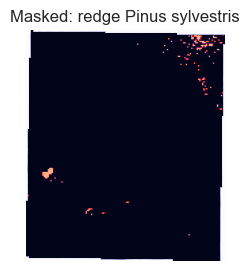

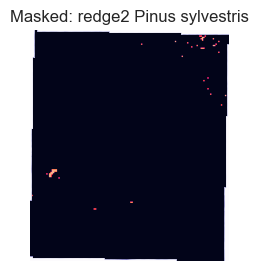

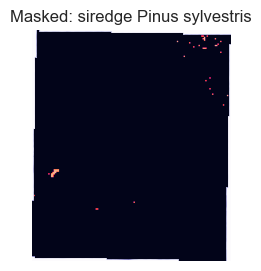

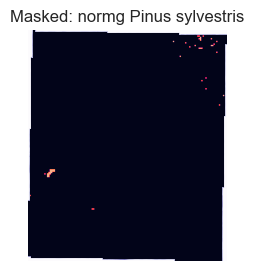

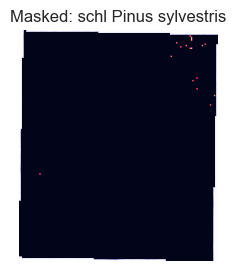

--------------------------------------------------------------------------------
left edge coord:	405045.0	
bottom edge coord:	6151200.0	
right edge coord:	405453.0	
top edge coord:	6151713.0	
dataset width:	136	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 405045.00|
| 0.00,-3.00, 6151713.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

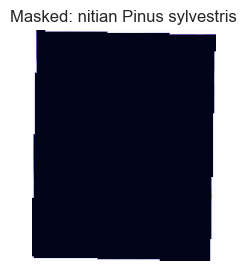

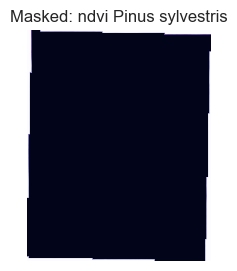

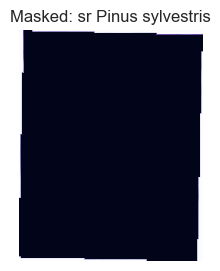

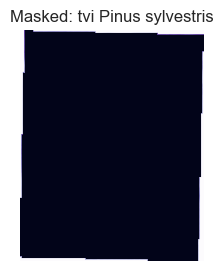

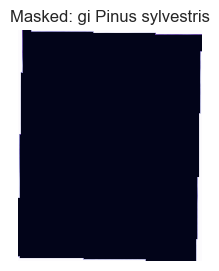

...

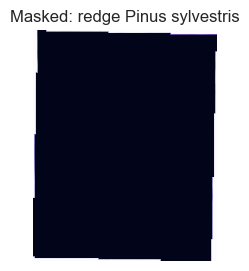

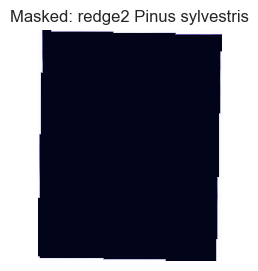

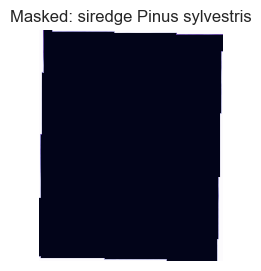

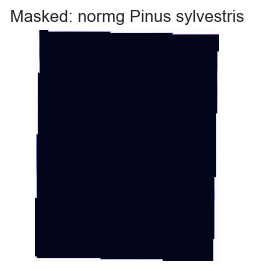

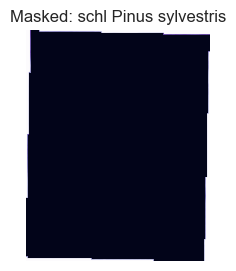

--------------------------------------------------------------------------------
left edge coord:	400761.0	
bottom edge coord:	4613787.0	
right edge coord:	401289.0	
top edge coord:	4614297.0	
dataset width:	176	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 400761.00|
| 0.00,-3.00, 4614297.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

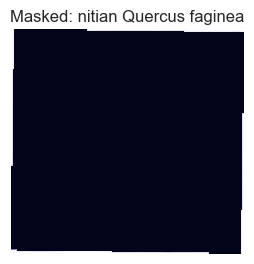

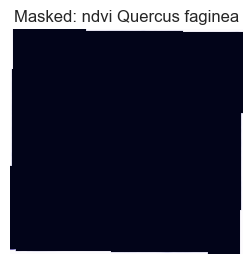

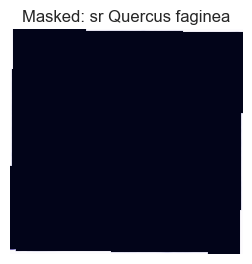

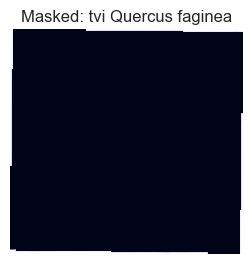

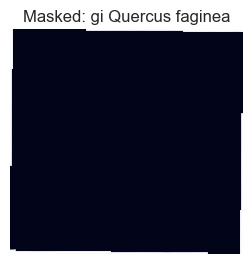

...

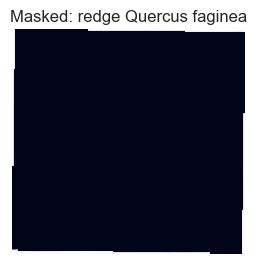

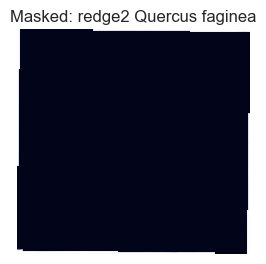

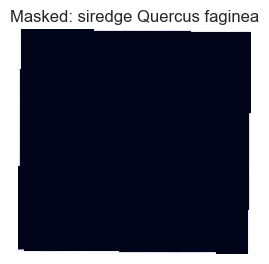

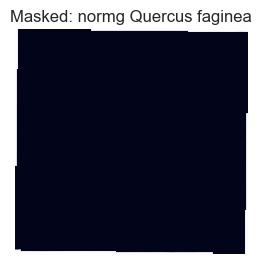

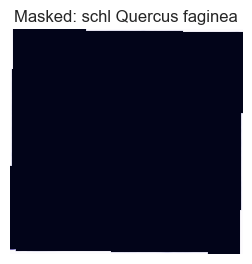

--------------------------------------------------------------------------------
left edge coord:	333759.0	
bottom edge coord:	4689792.0	
right edge coord:	334290.0	
top edge coord:	4690305.0	
dataset width:	177	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 333759.00|
| 0.00,-3.00, 4690305.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

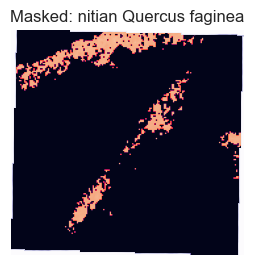

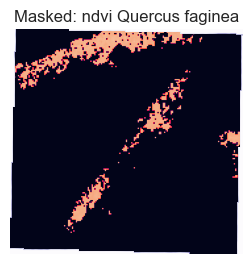

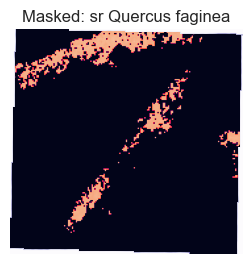

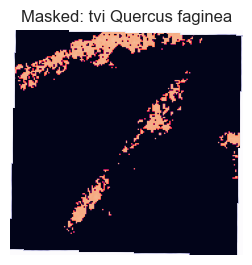

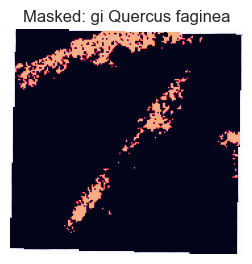

...

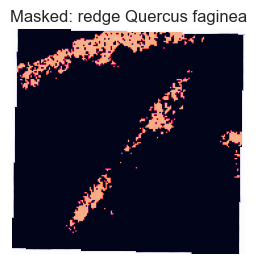

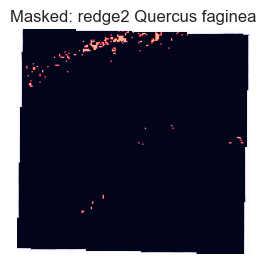

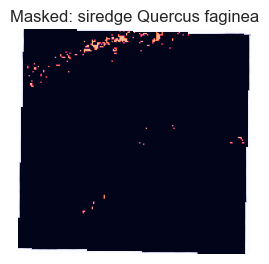

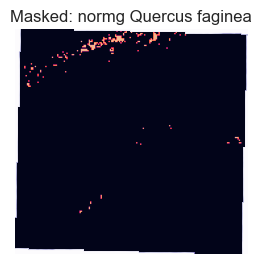

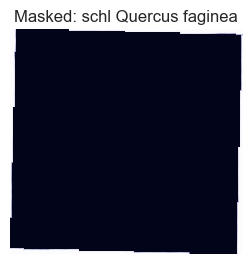

--------------------------------------------------------------------------------
left edge coord:	415257.0	
bottom edge coord:	3907341.0	
right edge coord:	415833.0	
top edge coord:	3907851.0	
dataset width:	192	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 415257.00|
| 0.00,-3.00, 3907851.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

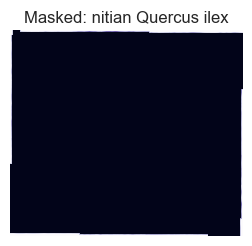

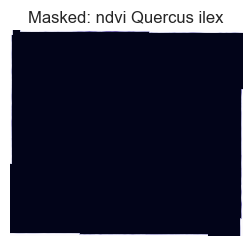

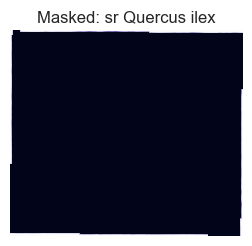

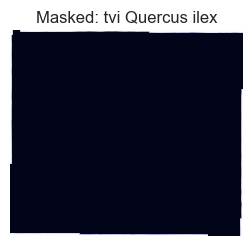

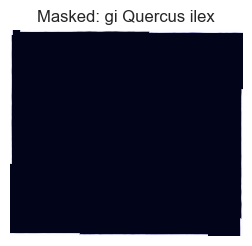

...

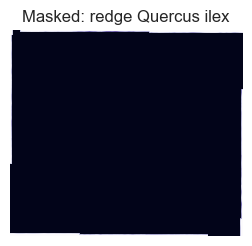

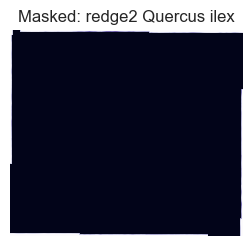

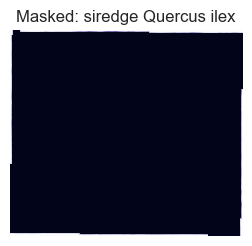

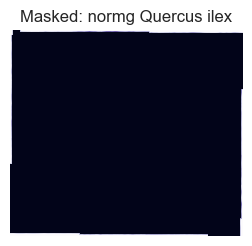

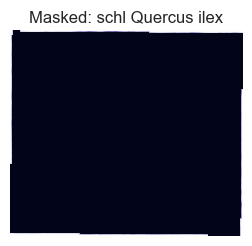

--------------------------------------------------------------------------------
left edge coord:	407373.0	
bottom edge coord:	3944910.0	
right edge coord:	407946.0	
top edge coord:	3945420.0	
dataset width:	191	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 407373.00|
| 0.00,-3.00, 3945420.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

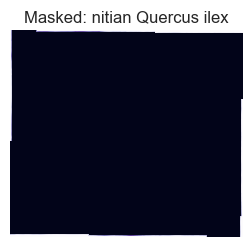

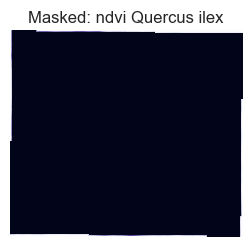

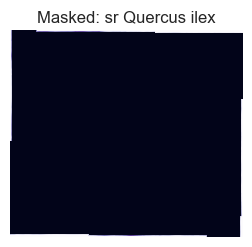

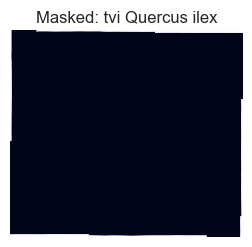

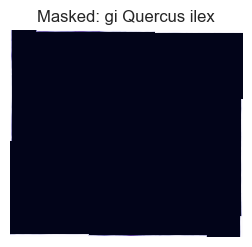

...

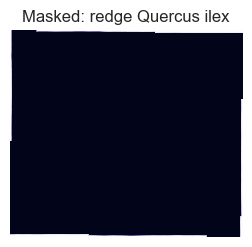

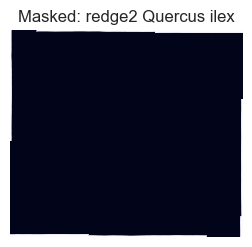

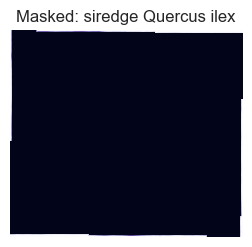

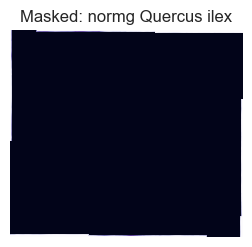

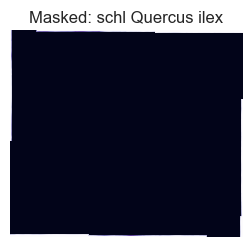

--------------------------------------------------------------------------------
left edge coord:	272778.0	
bottom edge coord:	4662708.0	
right edge coord:	273315.0	
top edge coord:	4663230.0	
dataset width:	179	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 272778.00|
| 0.00,-3.00, 4663230.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

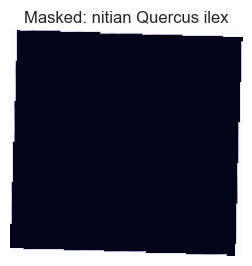

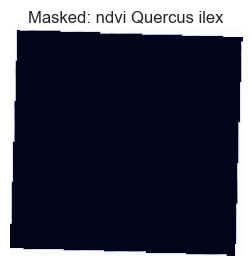

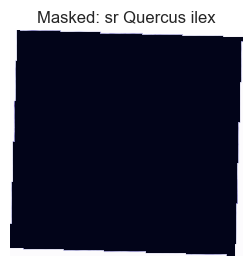

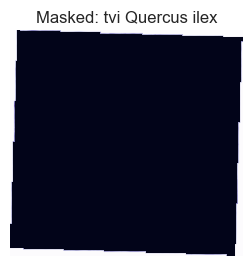

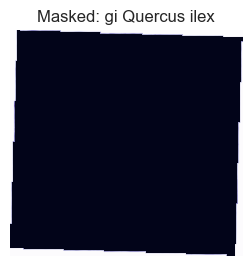

...

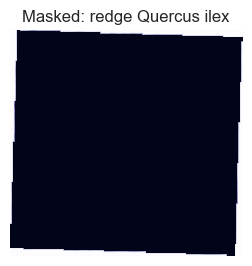

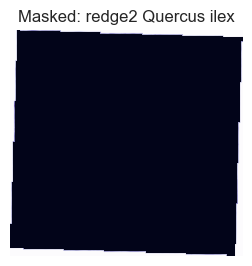

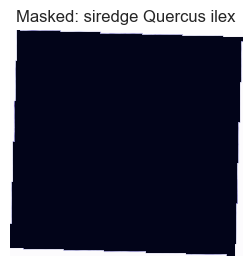

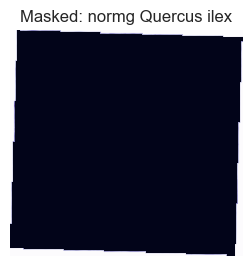

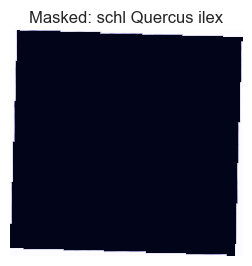

--------------------------------------------------------------------------------
left edge coord:	354759.0	
bottom edge coord:	4599795.0	
right edge coord:	355293.0	
top edge coord:	4600308.0	
dataset width:	178	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 354759.00|
| 0.00,-3.00, 4600308.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

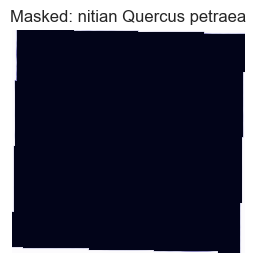

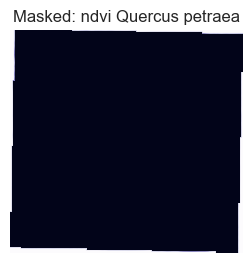

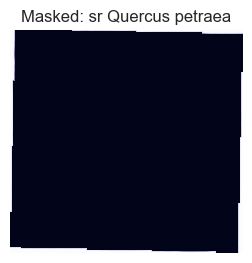

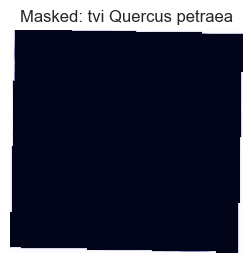

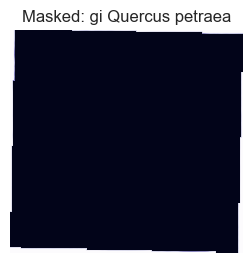

...

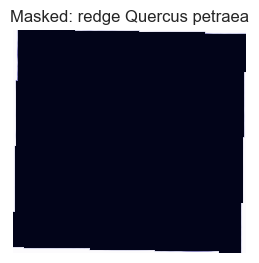

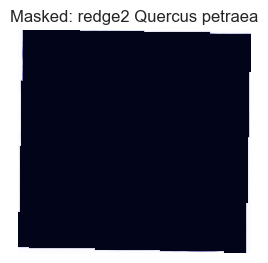

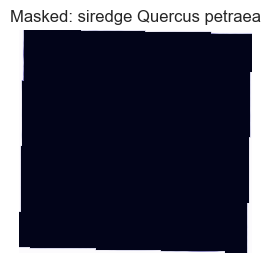

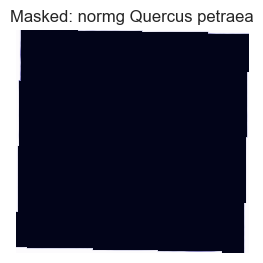

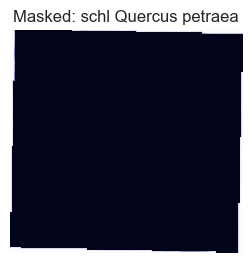

--------------------------------------------------------------------------------
left edge coord:	384783.0	
bottom edge coord:	4670778.0	
right edge coord:	385311.0	
top edge coord:	4671288.0	
dataset width:	176	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 384783.00|
| 0.00,-3.00, 4671288.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

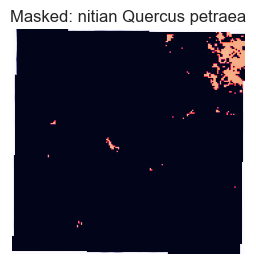

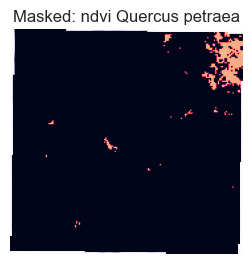

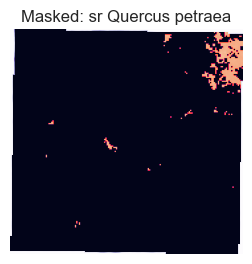

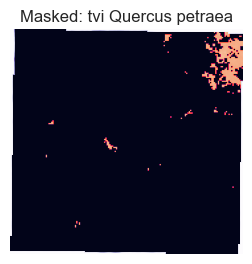

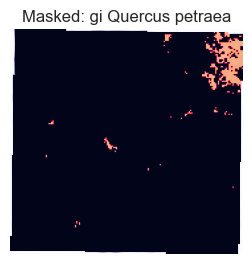

...

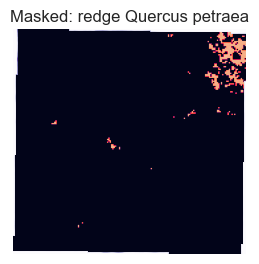

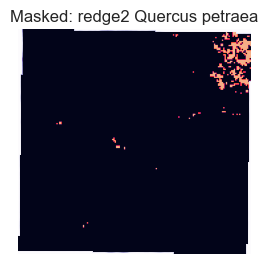

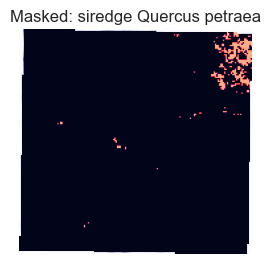

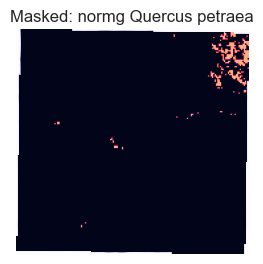

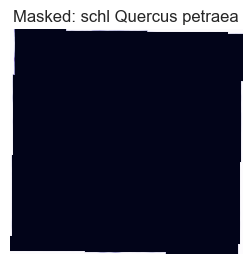

--------------------------------------------------------------------------------
left edge coord:	405774.0	
bottom edge coord:	4683792.0	
right edge coord:	406299.0	
top edge coord:	4684302.0	
dataset width:	175	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 405774.00|
| 0.00,-3.00, 4684302.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

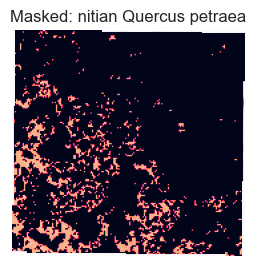

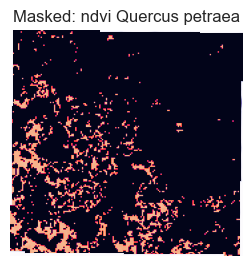

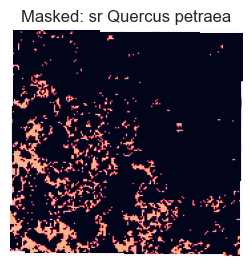

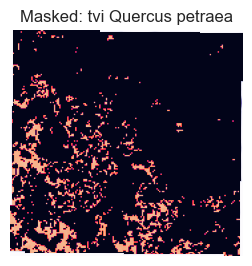

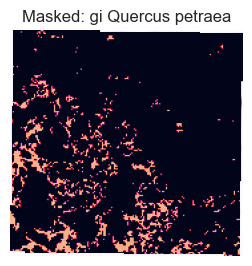

...

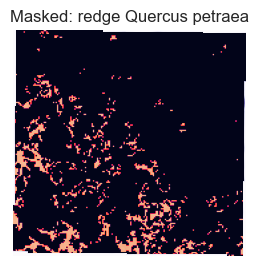

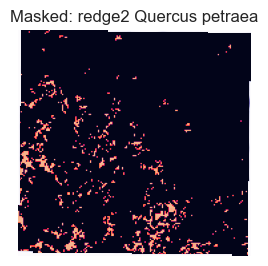

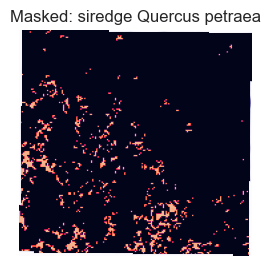

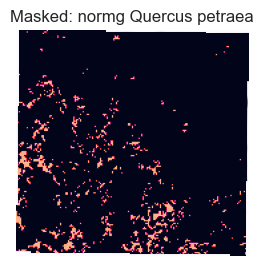

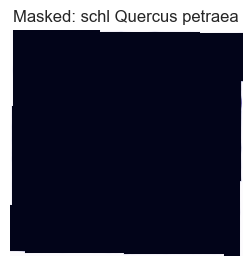

--------------------------------------------------------------------------------
left edge coord:	473487.0	
bottom edge coord:	5909358.0	
right edge coord:	473907.0	
top edge coord:	5909865.0	
dataset width:	140	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 473487.00|
| 0.00,-3.00, 5909865.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

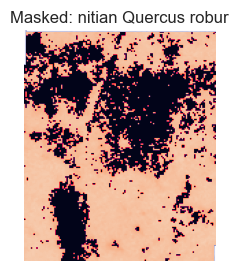

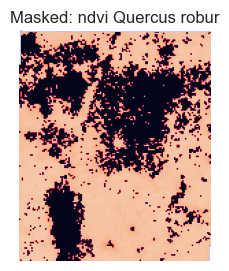

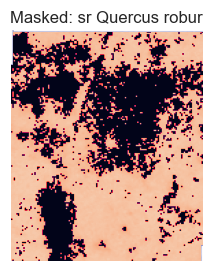

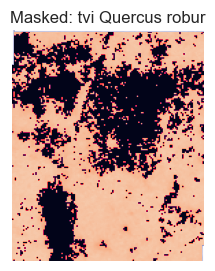

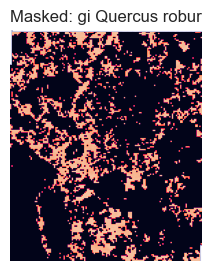

...

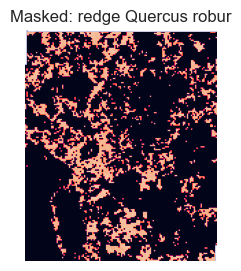

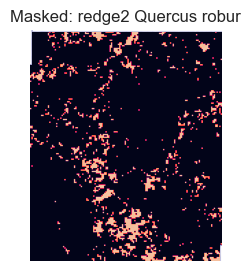

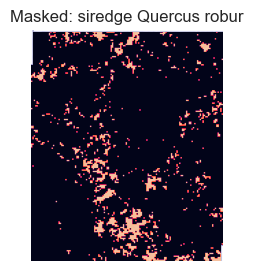

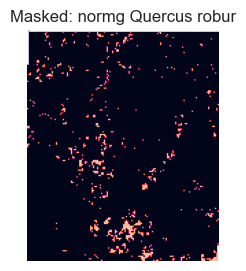

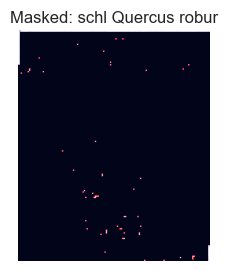

--------------------------------------------------------------------------------
left edge coord:	372918.0	
bottom edge coord:	6133077.0	
right edge coord:	373332.0	
top edge coord:	6133593.0	
dataset width:	138	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32637	
data transform
	| 3.00, 0.00, 372918.00|
| 0.00,-3.00, 6133593.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:58: RuntimeWarning: invalid value encountered in divide
  nitian = r_edge / (r_edge + blue_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:105: RuntimeWarning: invalid value encountered in divide
  sr = (nir / red_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:207: RuntimeWarning: invalid value encountered in divide
  gndvi = (nir - green_band) / (nir + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:238: RuntimeWarning: invalid value encountered in divide
  pri = (greeni_band - green_band) / (greeni_band + green_band)
/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packa

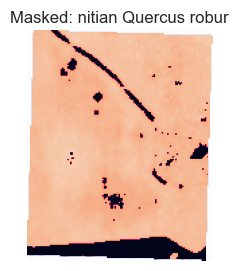

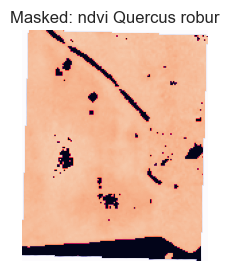

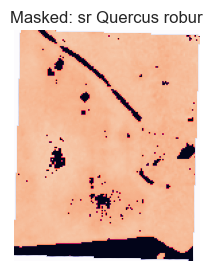

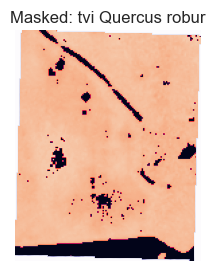

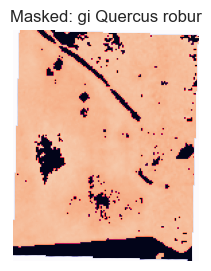

...

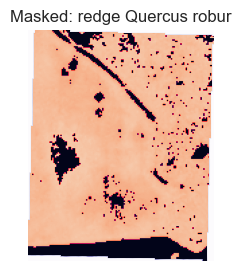

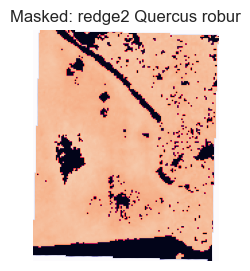

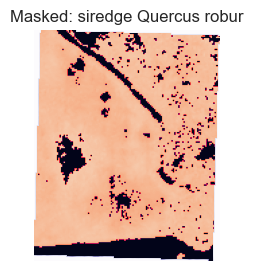

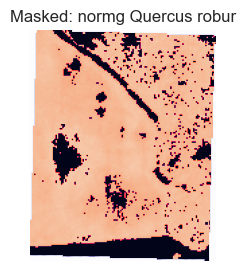

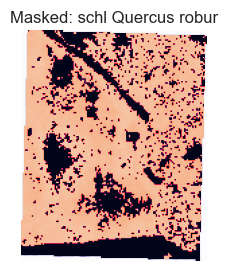

In [68]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

species = df['species'].values
for i, img_path in enumerate(df['path'].values):
    if img_path != None:
        o = Image()
        sp = species[i]
        o.load_image(image_path=img_path)
        c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
               id_col='id', sep=',', class1=s, class2=s, crs="EPSG:4326")
        c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=False)
        masking_cols, info_cols, ndvi = calcualte_average_indicies(c, o.image, label=sp, output_dir=data_dir)
        masks = []
        for i, col in enumerate(masking_cols):
            # Now we want to build a total mask...
            mean_v = np.mean(ind_df[col].values)
            std_v = np.std(ind_df[col].values)
            lower_bound = np.min(ind_df[col].values) - 1.5*std_v #mean_v - std_v
            upper_bound = np.max(ind_df[col].values) + 1.5*std_v #mean_v + std_v
            masks.append(mask_values(info_cols[i], lower_bound, upper_bound))

        total_mask = masks[0]
        for mi, mask in enumerate(masks[1:]):
            total_mask *= mask
            # Plot each tree individually and the class that it belongs to
            ax = o.plot(2, show_plot=False)
            ax.imshow(total_mask*ndvi, vmin=0, vmax=1)
            plt.title(f'Masked: {masking_cols[mi]} {sp}')
            plt.show()

In [ ]:
# Get the ones tha didn't work and try to look at why...


In [69]:
df

,id,latitude,longitude,tree_id,data_1,data_2,data_3,data_4,data_5,division,...,crown_radius_m,binary_label,x0,x1,y0,y1,polygon_90m,image_ids,Unnamed: 23,path
0,52489,46.0200,8.7900,T_496860,"46.018877, 8.791883","46.019303, 8.792329","46.019084, 8.792871","46.018289, 8.792228","46.019766, 8.792395",Angiosperm,...,2.700000,0,46.019438,46.020562,8.789595,8.790405,"[(8.789594594594593, 46.020562500000004), (8.7...",20220715_092201_89_2430,NaN,../data/tallo/planetscope/sat_data/205329a8-65...
1,52503,46.0900,8.8900,T_497005,"46.089792, 8.889785","46.090280, 8.889065","46.089768, 8.889817","46.089844, 8.890508","46.090099, 8.890372",Angiosperm,...,4.250000,0,46.089438,46.090562,8.889595,8.890405,"[(8.889594594594595, 46.090562500000004), (8.8...",20220731_091842_58_2464,NaN,../data/tallo/planetscope/sat_data/97ad3efd-02...
2,52514,46.3800,6.8500,T_496903,"46.379959, 6.849751","46.380322, 6.849487","46.379656, 6.849976","46.379708, 6.850174","46.379843, 6.850512",Angiosperm,...,3.888889,0,46.379438,46.380563,6.849595,6.850405,"[(6.849594594594595, 46.3805625), (6.849594594...",20220717_093452_75_2235,NaN,../data/tallo/planetscope/sat_data/7887de72-9a...
18,59,-34.1700,148.3850,T_390917,"-34.168968, 148.385539","-34.169413, 148.385905","-34.169782, 148.386294","-34.170220, 148.386334","-34.170205, 148.386912",Angiosperm,...,NaN,0,-34.170563,-34.169438,148.384595,148.385405,"[(148.38459459459457, -34.1694375), (148.38459...",20221218_230804_14_2459,NaN,../data/tallo/planetscope/sat_data/56ab7622-ea...
22,77,-32.9000,148.5000,T_327763,"-32.896631, 148.500740","-32.899721, 148.495397","-32.900099, 148.495027","-32.898845, 148.503096","-32.902217, 148.497227",Angiosperm,...,NaN,0,-32.900562,-32.899437,148.499595,148.500405,"[(148.49959459459458, -32.8994375), (148.49959...",20221225_231035_90_2464,"-32.902045, 148.495835",../data/tallo/planetscope/sat_data/af03ac5c-67...
23,78,-31.6000,117.7000,T_330648,"-31.600642, 117.700658","-31.600697, 117.700957","-31.600860, 117.701688","-31.601095, 117.700510","-31.600990, 117.702370",Angiosperm,...,NaN,0,-31.600562,-31.599438,117.699595,117.700405,"[(117.6995945945946, -31.5994375), (117.699594...",20221230_011616_53_2465,"-31.601308, 117.702947",../data/tallo/planetscope/sat_data/69f52d46-95...
26,0,-43.2561,146.9190,T_498824,"-43.256738, 146.918326","-43.256360, 146.919388","-43.256566, 146.920040","-43.257246, 146.920361","-43.256546, 146.921069",Angiosperm,...,NaN,0,-43.256662,-43.255538,146.918595,146.919405,"[(146.9185945945946, -43.2555375), (146.918594...",20230113_230929_43_241e,NaN,None
27,1,-42.9662,146.7574,T_498779,"-42.966351, 146.756606","-42.966956, 146.756019","-42.966277, 146.756639","-42.967042, 146.754272","-42.967331, 146.755398",Angiosperm,...,NaN,0,-42.966763,-42.965637,146.756995,146.757805,"[(146.75699459459457, -42.9656375), (146.75699...",20230113_230924_81_241e,NaN,../data/tallo/planetscope/sat_data/e4f78ad4-f3...
28,4,-42.8000,147.6000,T_332054,"-42.799385, 147.601838","-42.799670, 147.601987","-42.799785, 147.601985","-42.799099, 147.602248","-42.800043, 147.602063",Angiosperm,...,NaN,0,-42.800562,-42.799438,147.599595,147.600405,"[(147.59959459459458, -42.799437499999996), (1...",20221226_230459_63_2465,NaN,../data/tallo/planetscope/sat_data/7ff0b6f0-ac...
94,52659,52.8700,13.9000,T_385596,"52.870205, 13.899568","52.870021, 13.899183","52.869676, 13.900177","52.869570, 13.899691","52.869485, 13.900157",Angiosperm,...,1.555556,0,52.869437,52.870562,13.899595,13.900405,"[(13.899594594594594, 52.8705625), (13.8995945...",20220627_090602_59_2455,"52.870072, 13.900685",../data/tallo/planetscope/sat_data/112da36e-77...


In [70]:
len(set(species))

13

--------------------------------------------------------------------------------
left edge coord:	405774.0	
bottom edge coord:	4683792.0	
right edge coord:	406299.0	
top edge coord:	4684302.0	
dataset width:	175	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 405774.00|
| 0.00,-3.00, 4684302.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342238 ../data/tallo/planetscope/sat_data/fe1db68e-ff6b-482f-9bcf-f1a671a64948/PSScene/20230625_094227_36_2451_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


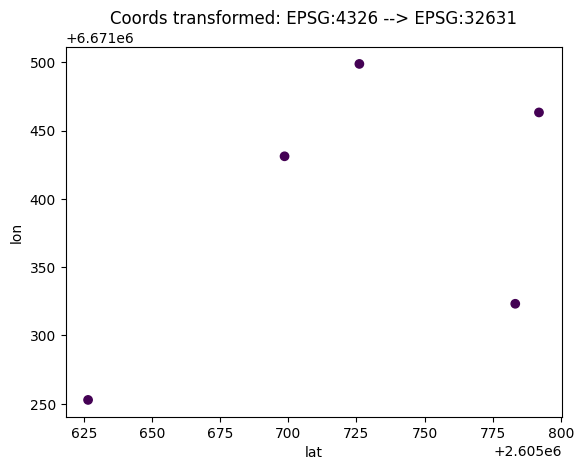

<Axes: >

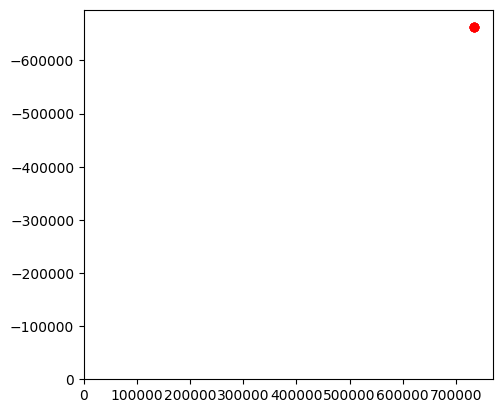

In [167]:
o = Image()
o.load_image(image_path=img_path)
print(t_ids[i], img_path, df['species'].values[i])
c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
       id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=True)
c.plot_on_image(o)

In [168]:
print(o.image.crs)

EPSG:32631


KeyError: 'path'

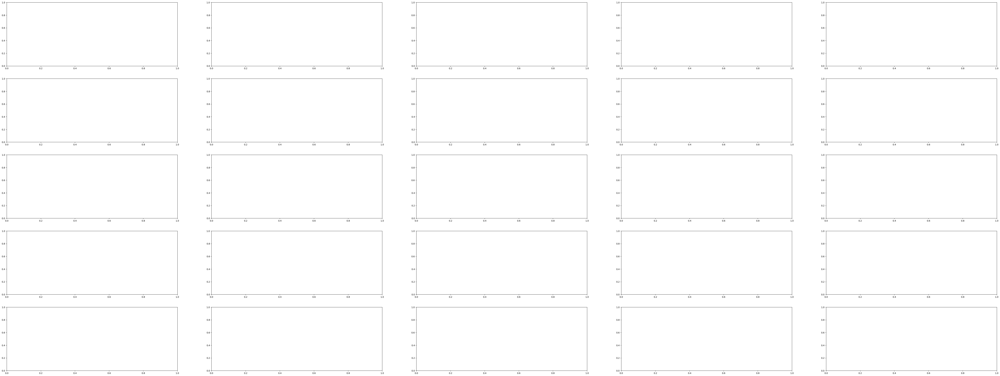

In [169]:
from remseno.indices import *
sub_df = df.head(20)
n = 5
fig, axs = plt.subplots(n,n, figsize=(80, 30), facecolor='w', edgecolor='w')

labels = sub_df['species'].values
axs = axs.ravel()
axi = 0
for img_path in sub_df['path'].values:
    if img_path != None:
        try:
            o = Image()
            o.load_image(image_path=img_path)
            o.name=labels[axi]
            ndvi = get_ndvi(image=o.image, red_band=6, nir_band=8)
            mask = o.mask_on_index(ndvi, 0.75)
            axs[axi].imshow(mask*ndvi)
            axi += 1
        except:
            break
plt.savefig(f'{fig_dir}Figure2_planetscope_NDVI_mask.svg')
plt.show()


In [64]:
from remseno.indices import *
sub_df = df.head(50)
n = 5
fig, axs = plt.subplots(n,n, figsize=(30, 30), facecolor='w', edgecolor='w')

labels = sub_df['species'].values
axs = axs.ravel()
axi = 0
for img_path in sub_df['path'].values:
    if img_path != None:
        try:
            o = Image()
            o.load_image(image_path=img_path)
            o.name=labels[axi]
            ndvi = get_ndvi(image=o.image, red_band=6, nir_band=8)
            mask = o.mask_on_index(ndvi, 0.5)
            axs[axi].imshow(mask*ndvi)
            axi += 1
        except:
            break
plt.savefig(f'{fig_dir}Figure2_planetscope_NDVI_mask.svg')
plt.show()


--------------------------------------------------------------------------------
left edge coord:	479958.0	
bottom edge coord:	5242659.0	
right edge coord:	480471.0	
top edge coord:	5243163.0	
dataset width:	171	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 479958.00|
| 0.00,-3.00, 5243163.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	548805.0	
bottom edge coord:	5260968.0	
right edge coord:	549321.0	
top edge coord:	5261472.0	
dataset width:	172	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 548805.00|
| 0.00,-3.00, 5261472.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

In [60]:
# Now try and build a classifier/dataset from the images. Randomly sample from the highest NDVI 

array(['Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus camaldulensis', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus globulus',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globu

In [41]:
# Create training data from a list of images linked to a list of coords 